In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib
import math
import scipy

matplotlib.rcParams["figure.dpi"] = 300
matplotlib.rcParams['savefig.dpi'] = 300

def norm_01(A):
    return (A - np.min(A)) / np.max((A - np.min(A)))

def zscore(A, axis=None):
    mu = np.nanmean(A, axis=axis)
    sigma = np.nanstd(A, axis=axis)
    return (A - mu) / sigma

In [2]:
########################################################################
# t5-small results
########################################################################


t5_small_wmt_lm_combined_years_loss = np.array([3.3887, 3.351, 3.3744, 3.3763, 3.3761])


# news summarization
t5_small_news_sum = np.array([
[52.04, 49.50,	37.00,	27.35,	26.59],
[51.18,	50.09,	37.71,	27.81,	27.90],
[48.41,	47.24,	38.54,	28.09,	29.78],
[38.35,	37.06,	31.27,	34.57,	31.58],
[38.74,	38.12,	32.24,	28.53,	32.37]])

t5_small_vanilla_news_sum = np.array([35.66, 20.57,	19.37, 18.32, 18.36])
t5_small_all_year_train_news_sum = np.array([50.68, 48.78, 38.25, 32.03, 30.58])
t5_small_news_sum_labeled_routing = np.trace(t5_small_news_sum) / len(t5_small_news_sum)
t5_small_news_sum_wmt_task_analogy = np.array([53.41,	49.98,	38.32,	28.64,	29.16])
t5_small_news_sum_wmt_task_addition = np.array([49.71, 46.85,	36.44,	27.76,	27.12])
t5_small_news_sum_scaling = np.array([52.67,	49.50,	38.20,	28.05,	28.28])

t5_small_news_sum_swapped_embeddings = np.array([52.04, 47.96,	36.59,	26.59,	26.07])
t5_small_news_sum_swapped_non_embeddings = np.array([52.04, 48.17,	36.71,	33.10,	30.98])
t5_small_news_sum_swapped_ff_layers = np.array([52.04, 47.79,	36.72,	27.48,	28.69])
t5_small_news_sum_swapped_attn_layers = np.array([52.04, 47.09,	35.52,	28.98,	26.39])

# news source classification
t5_small_news_cls = np.array([
[0.9089,	0.9166,	0.7384,	0.5099,	0.7278],
[0.8875,	0.9293,	0.7534,	0.7105,	0.7375],
[0.8164,	0.8415,	0.8781,	0.8344,	0.7868],
[0.8004,	0.7469,	0.8164,	0.8587,	0.8242],
[0.8096,	0.7364,	0.7732,	0.8185,	0.8376]])

t5_small_all_year_train_news_cls = np.array([0.9053, 0.9271, 0.8809, 0.8618, 0.8385])
t5_small_news_cls_labeled_routing = np.trace(t5_small_news_cls) / len(t5_small_news_cls)
t5_small_news_cls_wmt_task_analogy = np.array([0.9148,	0.9204,	0.7533,	0.7034,	0.7392])
t5_small_news_cls_wmt_task_addition = np.array([0.9130, 0.9191, 0.7303, 0.6835, 0.7263])
t5_small_news_cls_scaling = np.array([0.9131, 0.9166, 0.7384, 0.6900, 0.7321])

t5_small_news_cls_swapped_embeddings = np.array([0.9089, 0.9166,	0.7384,	0.5101,	0.7278])
t5_small_news_cls_swapped_non_embeddings = np.array([0.9089, 0.9301,	0.8785,	0.8578,	0.8376])
t5_small_news_cls_swapped_ff_layers = np.array([0.9089, 0.9234,	0.8053,	0.7579,	0.7780])
t5_small_news_cls_swapped_attn_layers = np.array([0.9089, 0.9141,	0.7711,	0.7485,	0.7605])

# language modeling on wmt articles
t5_small_wmt_lm_loss = np.array([
[3.514,	3.541,	3.586,	3.592,	3.583],
[3.553,	3.498,	3.547,	3.557,	3.561],
[3.567,	3.519,	3.520,	3.540,	3.551],
[3.581,	3.532,	3.543,	3.520,	3.535],
[3.583,	3.544,	3.562,	3.543,	3.512]])
t5_small_wmt_vanilla_loss = np.array([6.466, 6.444, 6.446, 6.446, 6.441])

t5_small_wmt_lm_swapped_embeddings = np.array([3.514, 3.637,	3.667,	3.668,	3.656])
t5_small_wmt_lm_swapped_non_embeddings = np.array([3.514, 3.601,	3.617,	3.618,	3.608])
t5_small_wmt_lm_swapped_ff_layers = np.array([3.514, 3.619,	3.642,	3.640,	3.629])
t5_small_wmt_lm_swapped_attn_layers = np.array([3.514, 3.638,	3.667,	3.672,	3.660])

# AI venue classification
t5_small_aic = np.array([
[0.8924,	0.9132,	0.8583,	0.8274,	0.6777],
[0.8697,	0.9083,	0.8503,	0.8242,	0.6335],
[0.8468,	0.8931,	0.8829,	0.8691,	0.7778],
[0.8345,	0.8933,	0.8637,	0.8616,	0.8296],
[0.8366,	0.7768,	0.7692,	0.7618,	0.8851]])

t5_small_all_year_train_aic = np.array([0.9274,	0.9394,	0.8933,	0.8813,	0.8252])
t5_small_aic_labeled_routing = np.trace(t5_small_aic) / len(t5_small_aic)
t5_small_aic_arxiv_task_analogy = np.array([0.9100,	0.9183,	0.8802,	0.8515,	0.7718])
t5_small_aic_arxiv_task_addition = np.array([0.9050,	0.8993,	0.8777,	0.8515,	0.7774])
t5_small_aic_scaling = np.array([0.9100, 0.9132,	0.8827,	0.8441,	0.7348])

t5_small_aic_swapped_embeddings = np.array([0.8924, 0.9132,	0.8583,	0.8274,	0.6777])
t5_small_aic_swapped_non_embeddings = np.array([0.8924, 0.9083,	0.8829,	0.8616,	0.8851])
t5_small_aic_swapped_ff_layers = np.array([0.8924, 0.9235,	0.8615,	0.8621,	0.7530])
t5_small_aic_swapped_attn_layers = np.array([0.8924, 0.9157,	0.8805,	0.8547,	0.8065])

# language modeling on arxiv articles
t5_small_arxiv_lm_loss = np.array([
[2.582,	2.715,	2.827,	2.947,	3.112],
[2.534,	2.635,	2.748,	2.852,	3.019],
[2.577,	2.680,	2.709,	2.824,	2.957],
[2.590,	2.679,	2.731,	2.793,	2.918],
[2.654,	2.746,	2.768,	2.841,	2.893]])
t5_small_arxiv_vanilla_loss = np.array([5.992,	6.122,	6.156,	6.269,	6.356])

t5_small_arxiv_lm_swapped_embeddings = np.array([2.582, 3.250,	3.321,	3.330,	3.441])
t5_small_arxiv_lm_swapped_non_embeddings = np.array([2.582, 3.179,	3.220,	3.208,	3.277])
t5_small_arxiv_lm_swapped_ff_layers = np.array([2.582, 3.216,	3.272,	3.265,	3.343])
t5_small_arxiv_lm_swapped_attn_layers = np.array([2.582, 3.248,	3.316,	3.326,	3.439])

# political affiliation
t5_small_poli_aff = np.array([
[0.8748,	0.7493,	0.6336,	0.5850,	0.5217,	0.4620],
[0.8006,	0.8435,	0.7131,	0.6272,	0.5424,	0.5053],
[0.6727,	0.7081,	0.8077,	0.7146,	0.6033,	0.5795],
[0.5733,	0.5984,	0.7415,	0.7907,	0.7026,	0.6365],
[0.4834,	0.5550,	0.6540,	0.7171,	0.7865,	0.7201],
[0.3926,	0.4705,	0.5910,	0.6463,	0.7223,	0.7710]])

t5_small_all_year_train_poli_aff = np.array([0.8015,	0.7874,	0.8100,	0.7520,	0.7310,	0.6670])
t5_small_poli_aff_labeled_routing = np.trace(t5_small_aic) / len(t5_small_aic)
t5_small_poli_aff_twitter_task_analogy = np.array([0.8804,	0.7600,	0.6487,	0.5811,	0.5189,	0.4657])
t5_small_poli_aff_twitter_task_addition = np.array([0.8735,	0.7660,	0.6429,	0.5801,	0.5183,	0.4427])
t5_small_poli_aff_scaling = np.array([0.8804,	0.7599,	0.6336, 0.5850,	0.5323,	0.4624])

t5_small_poli_aff_swapped_embeddings = np.array([0.8748, 0.7474,	0.6347,	0.5856,	0.523,	0.4601])
t5_small_poli_aff_swapped_non_embeddings = np.array([0.8748, 0.8435,	0.807,	0.7894,	0.7865,	0.7691])
t5_small_poli_aff_swapped_ff_layers = np.array([0.8748, 0.7701,	0.6681,	0.6403,	0.4126,	0.5957])
t5_small_poli_aff_swapped_attn_layers = np.array([0.8748, 0.7588,	0.6892,	0.6469,	0.5448,	0.4076])

# language modeling on tweets
t5_small_twitter_lm_loss = np.array([
[1.7432,	1.8366,	1.8758,	1.9012,	1.9254,	1.9635],
[1.8390,	1.7715,	1.8367,	1.8694,	1.8953,	1.9338],
[1.8861,	1.8425,	1.7586,	1.8484,	1.8777,	1.9167],
[1.9350,	1.8907,	1.8620,	1.6891,	1.8523,	1.8976],
[1.9480,	1.9080,	1.8770,	1.8225,	1.7745,	1.8516],
[1.9743,	1.9308,	1.8998,	1.8551,	1.8309,	1.7833]])
t5_small_twitter_vanilla_loss = np.array([5.3198, 5.3270, 5.3239, 5.3178, 5.3311, 5.3674])

t5_small_twitter_lm_swapped_embeddings = np.array([1.7432, 4.2558,	4.3184,	4.3652,	4.4167,	4.4838])
t5_small_twitter_lm_swapped_non_embeddings = np.array([1.7432, 4.1911,	4.4684,	4.1522,	4.4211,	4.4371])
t5_small_twitter_lm_swapped_ff_layers = np.array([1.7432, 4.2043,	4.3255,	4.1435,	4.3002,	4.3773])
t5_small_twitter_lm_swapped_attn_layers = np.array([1.7432, 4.2382,	4.3650,	4.4014,	4.4167,	4.4772])

########################################################################
# t5-large results
########################################################################

# news summarization
t5_large_news_sum = np.array([
[52.09,	49.48,	37.89,	27.84,	27.56],
[51.49,	50.79,	38.80,	28.38,	29.23],
[49.13,	47.91,	39.53,	31.21,	31.23],
[39.83,	38.42,	33.25,	36.06,	33.28],
[40.85,	39.84,	34.34,	30.64,	33.20],
])
t5_large_all_year_train_news_sum = np.array([51.11,	48.58,	38.94,	32.04,	31.48])
t5_large_news_sum_labeled_routing = np.trace(t5_large_news_sum) / len(t5_large_news_sum)
t5_large_news_sum_wmt_task_analogy = np.array([53.33, 50.16, 39.25, 29.62, 29.88])
t5_large_news_sum_wmt_task_addition = np.array([52.73, 49.05, 38.79, 28.53, 27.88])
t5_large_news_sum_scaling = np.array([53.17, 49.82, 39.15, 28.60, 28.64])

# news source classification
t5_large_news_cls = np.array([
[0.9278,	0.9167,	0.7288,	0.6783,	0.7299],
[0.9035,	0.9464,	0.7823,	0.7361,	0.7427],
[0.8542,	0.8659,	0.9016,	0.8510,	0.7993],
[0.8399,	0.8337,	0.7940,	0.8759,	0.8298],
[0.8366,	0.8149,	0.7610,	0.8319,	0.8516],
])
t5_large_all_year_train_news_cls = np.array([0.9109,	0.9245,	0.8984,	0.8740,	0.8537])
t5_large_news_cls_labeled_routing = np.trace(t5_large_news_cls) / len(t5_large_news_cls)
t5_large_news_cls_wmt_task_analogy = np.array([0.9322, 0.9178, 0.7547, 0.6950, 0.7352])
t5_large_news_cls_wmt_task_addition = np.array([0.9306, 0.9141, 0.7553, 0.6848, 0.7273])
t5_large_news_cls_scaling = np.array([0.9278, 0.9169, 0.7540, 0.6889, 0.7357])

t5_large_wmt_lm_loss = np.array([
[2.8988,	2.8983,	2.9249,	2.9294,	2.9153],
[2.9078,	2.8805,	2.9077,	2.9127,	2.9019],
[2.9149,	2.8880,	2.9021,	2.9090,	2.9011],
[2.9198,	2.8935,	2.9092,	2.9037,	2.8950],
[2.9211,	2.8984,	2.9160,	2.9102,	2.8876]])
t5_large_wmt_vanilla_loss = np.array([6.1573,	6.1377,	6.1439,	6.1458, 6.1366])

# political affiliation
t5_large_poli_aff = np.array([
[0.8671,	0.7555,	0.6413,	0.5630,	0.5106,	0.4476],
[0.8293,	0.8206,	0.6999,	0.6448,	0.5244,	0.4542],
[0.6666,	0.6992,	0.8065,	0.7082,	0.6285,	0.5770],
[0.5841,	0.6379,	0.7664,	0.7826,	0.7068,	0.6665],
[0.4821,	0.5652,	0.6697,	0.7070,	0.7719,	0.7066],
[0.4256,	0.5089,	0.6284,	0.6578,	0.7353,	0.7696],
])
t5_large_all_year_train_poli_aff = np.array([0.7707,	0.7747,	0.7912,	0.7592,	0.7239,	0.6541])
t5_large_poli_aff_labeled_routing = np.trace(t5_large_poli_aff) / len(t5_large_poli_aff)
t5_large_poli_aff_twitter_task_analogy = np.array([0.8671,	0.7092,	0.6078, 0.5624,	0.5229,	0.5167])
t5_large_poli_aff_twitter_task_addition = np.array([0.8735,	0.7660,	0.6429,	0.5801,	0.5183,	0.4427])
t5_large_poli_aff_scaling = np.array([0.8804,	0.7599,	0.6336,	0.5850,	0.5323,	0.4624])

# language modeling on tweets
t5_large_twitter_lm_loss = np.array([
[1.7035,	1.7564,	1.7799,	1.7973,	1.8173,	1.8480],
[1.7627,	1.7211,	1.7549,	1.7732,	1.7955,	1.8268],
[1.7918,	1.7583,	1.7147,	1.7520,	1.7760,	1.8083],
[1.8243,	1.7906,	1.7678,	1.6713,	1.7567,	1.7930],
[1.8337,	1.8032,	1.7785,	1.7341,	1.7195,	1.7687],
[1.8522,	1.8193,	1.7944,	1.7553,	1.7478,	1.7382]])
t5_large_twitter_vanilla_loss = np.array([5.5803,	5.5894,	5.5664,	5.5509,	5.5524,	5.5619])


# AI venue classification
t5_large_aic = np.array([
[0.9225,	0.8975,	0.8548,	0.8111,	0.6823],
[0.9025,	0.9315,	0.8762,	0.8349,	0.7063],
[0.8899,	0.9194,	0.8827,	0.8809,	0.8011],
[0.8899,	0.9222,	0.8822,	0.8585,	0.8375],
[0.8565,	0.7964,	0.7764,	0.7898,	0.9052],
])
t5_large_all_year_train_aic = np.array([0.9174,	0.9418,	0.9068,	0.8828,	0.8647])
t5_large_aic_labeled_routing = np.trace(t5_large_aic) / len(t5_large_aic)
t5_large_aic_arxiv_task_analogy = np.array([0.9275,	0.9091,	0.8714,	0.8251,	0.7210,])
t5_large_aic_arxiv_task_addition = np.array([0.9275,	0.9118,	0.8637,	0.8240,	0.7092])
t5_large_aic_scaling = np.array([0.9250,	0.9082,	0.8677,	0.8130,	0.7079])

# language modeling on arxiv articles
t5_large_arxiv_lm_loss = np.array([
[2.4321,	2.5391,	2.5847,	2.6801,	2.7650],
[2.4212,	2.5145,	2.5609,	2.6485,	2.7338],
[2.4437,	2.5367,	2.5450,	2.6382,	2.7043],
[2.4525,	2.5377,	2.5550,	2.6231,	2.6865],
[2.4871,	2.5728,	2.5732,	2.6425,	2.6771]])
t5_large_arxiv_vanilla_loss = np.array([6.0047,	6.0905,	6.1071,	6.1721,	6.2437])

########################################################################
# t5-3b results
########################################################################

# news summarization
t5_3b_news_sum = np.array([
[52.27,	49.84,	37.84,	27.99,	27.13],
[51.83,	50.56,	39.10,	28.58,	29.11],
[49.18,	48.06,	39.74,	30.50,	30.80],
[40.84,	38.89,	34.19,	36.76,	33.65],
[41.26,	39.92,	34.55,	30.81,	33.61],
])
t5_3b_all_year_train_news_sum = np.array([44.99,	42.91,	35.03,	27.71,	27.97])
t5_3b_news_sum_labeled_routing = np.trace(t5_3b_news_sum) / len(t5_3b_news_sum)
t5_3b_news_sum_wmt_task_analogy = np.array([53.36,	50.46,	39.41,	29.74,	30.37])
t5_3b_news_sum_wmt_task_addition = np.array([53.21,	49.00,	38.78,	28.78,	29.00])
t5_3b_news_sum_scaling = np.array([53.21,	50.17,	38.60,	28.27,	28.59])

# news source classification
t5_3b_news_cls = np.array([
[0.9476,	0.9292,	0.7524,	0.7016,	0.7458],
[0.9132,	0.9563,	0.8153,	0.7502,	0.7668],
[0.8678,	0.8753,	0.9126,	0.8672,	0.8159],
[0.8749,	0.8635,	0.8646,	0.8979,	0.8511],
[0.8645,	0.8384,	0.8179,	0.8675,	0.8733],
])
t5_3b_all_year_train_news_cls = np.array([0.9379,	0.9493,	0.9279,	0.9142,	0.8838])
t5_3b_news_cls_labeled_routing = np.trace(t5_3b_news_cls) / len(t5_3b_news_cls)
t5_3b_news_cls_wmt_task_analogy = np.array([0.9477,	0.9406,	0.7749,	0.7393,	0.7646])
t5_3b_news_cls_wmt_task_addition = np.array([0.9489,	0.9362,	0.7757,	0.7390,	0.7606])
t5_3b_news_cls_scaling = np.array([0.9477,	0.9350,	0.7754,	0.7366,	0.7628])


t5_3b_wmt_lm_loss = np.array([
[2.6179,	2.6136,	2.6402,	2.6455,	2.6327],
[2.6280,	2.6005,	2.6264,	2.6326,	2.6229],
[2.6327,	2.6056,	2.6200,	2.6269,	2.6199],
[2.6370,	2.6098,	2.6257,	2.6213,	2.6128],
[2.6408,	2.6176,	2.6349,	2.6299,	2.6094]])
t5_3b_wmt_vanilla_loss = np.array([7.2345,	7.1957,	7.1932,	7.1910,	7.1916])


# political affiliation
t5_3b_poli_aff = np.array([
[0.8922,	0.7833,	0.6776,	0.6050,	0.5948,	0.5310],
[0.8646,	0.8264,	0.7402,	0.6780,	0.5732,	0.5090],
[0.7372,	0.7607,	0.8495,	0.7807,	0.6867,	0.6322],
[0.6139,	0.6777,	0.7896,	0.8263,	0.7821,	0.7283],
[0.5473,	0.6439,	0.7540,	0.7820,	0.8493,	0.7926],
[0.5021,	0.6233,	0.7201,	0.7466,	0.8084,	0.8139]])

t5_3b_all_year_train_poli_aff = np.array([0.8870,	0.8522,	0.8740,	0.8516,	0.8440,	0.7637])
t5_3b_poli_aff_labeled_routing = np.trace(t5_3b_poli_aff) / len(t5_3b_poli_aff)
t5_3b_poli_aff_poli_aff_task_analogy = np.array([0.8922,	0.7871,	0.7127,	0.6276,	0.6431,	0.6025])
t5_3b_poli_aff_synthetic_poli_aff_task_analogy = np.array([0.8948,	0.7928,	0.7031,	0.618,	0.6522,	0.5851])
t5_3b_poli_aff_twitter_task_analogy = np.array([0.8922,	0.7855,	0.7080,	0.6233,	0.6430,	0.6025])
t5_3b_poli_aff_twitter_task_addition = np.array([0.8844,	0.7909,	0.7058,	0.6169,	0.6495,	0.5880])
t5_3b_poli_aff_scaling = np.array([0.8922,	0.7816,	0.7061,	0.6189,	0.6460,	0.5863])

# language modeling on tweets
t5_3b_twitter_lm_loss = np.array([
[1.6044,	1.6611,	1.6858,	1.7003,	1.7232,	1.7567],
[1.6684,	1.6216,	1.6585,	1.6751,	1.7011,	1.7350],
[1.7018,	1.6658,	1.6156,	1.6581,	1.6851,	1.7205],
[1.7362,	1.7001,	1.6763,	1.5661,	1.6649,	1.7043],
[1.7467,	1.7144,	1.6884,	1.6387,	1.6221,	1.6772],
[1.7647,	1.7307,	1.7040,	1.6607,	1.6537,	1.6398]])
t5_3b_twitter_vanilla_loss = np.array([5.7503,	5.7767,	5.7780,	5.7855,	5.7727,	5.7908])


# AI venue classification
t5_3b_aic = np.array([
[0.9250,	0.8963,	0.8590,	0.8055,	0.6553],
[0.9073,	0.9314,	0.8454,	0.7949,	0.6612],
[0.9050,	0.9190,	0.8725,	0.8539,	0.7856],
[0.9050,	0.8981,	0.8769,	0.8753,	0.8389],
[0.8694,	0.7865,	0.7811,	0.7828,	0.8936],
])
t5_3b_all_year_train_aic = np.array([0.9274,	0.9394,	0.8892,	0.8890,	0.8730])
t5_3b_aic_labeled_routing = np.trace(t5_large_aic) / len(t5_large_aic)
t5_3b_aic_arxiv_task_analogy = np.array([0.9324,	0.9255,	0.8523,	0.8343,	0.6742])
t5_3b_aic_arxiv_task_addition = np.array([0.9324,	0.9198,	0.8380,	0.7724,	0.6224])
t5_3b_aic_scaling = np.array([0.9324,	0.9047,	0.8590,	0.8248,	0.6655])

# language modeling on arxiv articles
t5_3b_arxiv_lm_loss = np.array([
[2.2451,	2.3390,	2.3741,	2.4575,	2.5278],
[2.2293,	2.3127,	2.3481,	2.4257,	2.4967],
[2.2483,	2.3313,	2.3360,	2.4173,	2.4758],
[2.2576,	2.3350,	2.3468,	2.4090,	2.4655],
[2.2810,	2.3588,	2.3582,	2.4218,	2.4563]])
t5_3b_arxiv_vanilla_loss = np.array([6.7679,	6.8743,	6.9051,	6.9886,	7.0858])


[Text(0.5, 0, '2015'),
 Text(1.5, 0, '2016'),
 Text(2.5, 0, '2017'),
 Text(3.5, 0, '2018'),
 Text(4.5, 0, '2019'),
 Text(5.5, 0, '2020')]

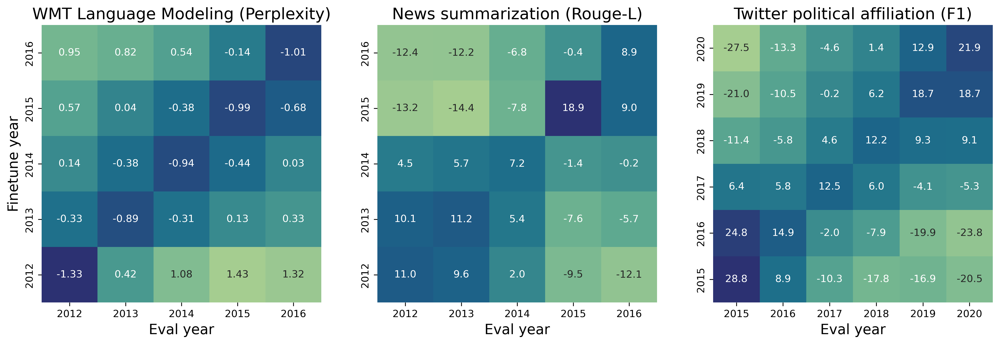

In [3]:
fig, axs = plt.subplots(1, 3, figsize=(17, 5))
axs = axs.flatten()

cmap="crest"

pct_wmt_lm_decay = 100 * (np.exp(t5_3b_wmt_lm_loss) - np.mean(np.exp(t5_3b_wmt_lm_loss), axis=0)) / np.mean(np.exp(t5_3b_wmt_lm_loss), axis=0)
ax = sns.heatmap(pct_wmt_lm_decay, ax=axs[0], annot=True, fmt=".2f",
                cmap="crest_r", cbar_kws={'label': 'Perplexity'}, cbar=False)
ax.invert_yaxis()
ax.set_title("WMT Language Modeling (Perplexity)", fontsize=16)
ax.set_ylabel("Finetune year", fontsize=14)
ax.set_xlabel("Eval year", fontsize=14)
ax.set_yticklabels(list(range(2012, 2017)))
ax.set_xticklabels(list(range(2012, 2017)))

pct_news_sum_change = 100 * (t5_3b_news_sum - np.mean(t5_3b_news_sum, axis=0)) / np.mean(t5_3b_news_sum, axis=0)
ax = sns.heatmap(pct_news_sum_change, ax=axs[1], annot=True, fmt=".1f",
                cmap=cmap, cbar_kws={'label': 'Rouge-L'}, cbar=False)
ax.invert_yaxis()
ax.set_title("News summarization (Rouge-L)", fontsize=16)
ax.set_xlabel("Eval year", fontsize=14)
ax.set_yticklabels(list(range(2012, 2017)))
ax.set_xticklabels(list(range(2012, 2017)))

pct_poli_aff_change = 100 * (t5_3b_poli_aff - np.mean(t5_3b_poli_aff, axis=0)) / np.mean(t5_3b_poli_aff, axis=0)
ax = sns.heatmap(pct_poli_aff_change, ax=axs[2], annot=True, fmt=".1f",
                cmap=cmap, cbar_kws={'label': 'Macro F1'}, cbar=False)
ax.invert_yaxis()
ax.set_title("Twitter political affiliation (F1)", fontsize=16)
ax.set_xlabel("Eval year", fontsize=14)
ax.yaxis.set_tick_params(labelsize = 10)
ax.xaxis.set_tick_params(labelsize = 10)
ax.set_yticklabels(list(range(2015, 2021)))
ax.set_xticklabels(list(range(2015, 2021)))


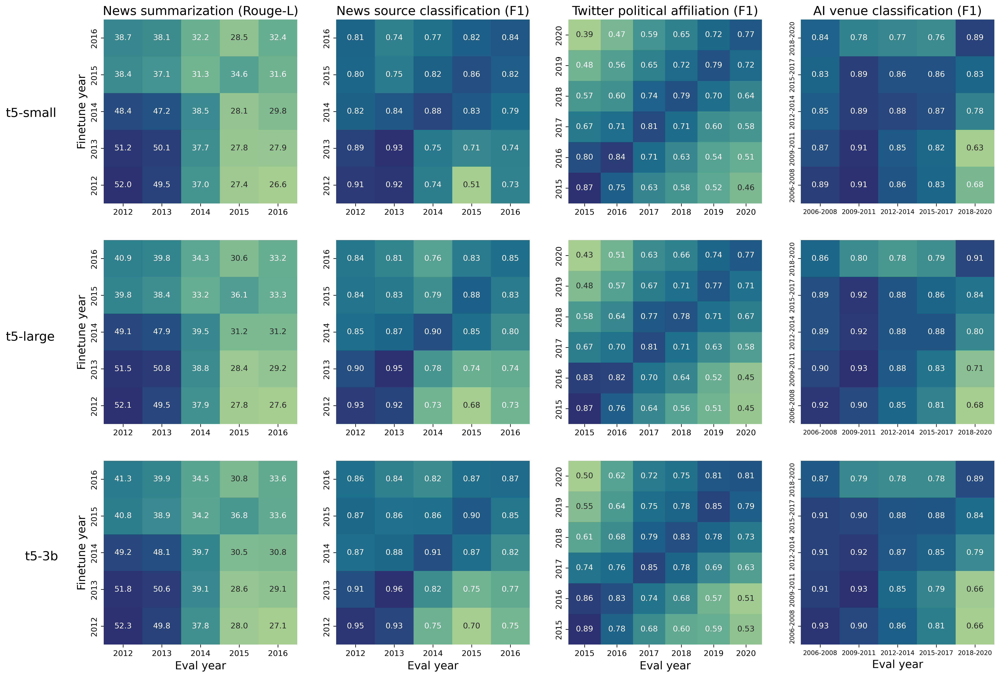

In [11]:
heatmaps = [[t5_small_news_sum, t5_small_news_cls, t5_small_poli_aff, t5_small_aic],
            [t5_large_news_sum, t5_large_news_cls, t5_large_poli_aff, t5_large_aic],
            [t5_3b_news_sum, t5_3b_news_cls, t5_3b_poli_aff, t5_3b_aic]]

fig, axs = plt.subplots(len(heatmaps), 4, figsize=(20, len(heatmaps) * 5))
#fig.suptitle("T5 Downstream Task Temporal Degredation", fontsize=18)

if len(heatmaps) == 1:
    axs = [axs]

cmap="crest"

for i in range(len(heatmaps)):
    ax = sns.heatmap(heatmaps[i][0], ax=axs[i][0], annot=True, fmt=".1f",
                    cmap=cmap, cbar_kws={'label': 'Rouge-L'}, cbar=False,
    )#vmin=26.6, vmax=52.3)
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("News summarization (Rouge-L)", fontsize=16)
    ax.set_ylabel("Finetune year", fontsize=14)
    if i == 2 or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.set_yticklabels(list(range(2012, 2017)))
    ax.set_xticklabels(list(range(2012, 2017)))

    ax = sns.heatmap(heatmaps[i][1], ax=axs[i][1], annot=True, fmt=".2f",
                    cmap=cmap, cbar_kws={'label': 'Macro F1'}, cbar=False,
    )#vmin=0.51, vmax=0.96)
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("News source classification (F1)", fontsize=16)
    if i == 2 or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.set_yticklabels(list(range(2012, 2017)))
    ax.set_xticklabels(list(range(2012, 2017)))

    ax = sns.heatmap(heatmaps[i][2], ax=axs[i][2], annot=True, fmt=".2f",
                    cmap=cmap, cbar_kws={'label': 'Macro F1'}, cbar=False,
    )#vmin=0.39, vmax=0.89)
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("Twitter political affiliation (F1)", fontsize=16)
    if i == 2 or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.yaxis.set_tick_params(labelsize = 10)
    ax.xaxis.set_tick_params(labelsize = 10)
    ax.set_yticklabels(list(range(2015, 2021)))
    ax.set_xticklabels(list(range(2015, 2021)))

    ax = sns.heatmap(heatmaps[i][3], ax=axs[i][3], annot=True, fmt=".2f",
                    cmap=cmap, cbar_kws={'label': 'Macro F1'}, cbar=False,
    )#vmin=0.63, vmax=0.93)
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("AI venue classification (F1)", fontsize=16)
    if i == 2 or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.yaxis.set_tick_params(labelsize = 8)
    ax.xaxis.set_tick_params(labelsize = 8)
    ax.set_yticklabels(["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"])
    ax.set_xticklabels(["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"])

plt.gcf().text(0.04, 0.21, "t5-3b", fontsize=16)
plt.gcf().text(0.023, 0.47, "t5-large", fontsize=16)
plt.gcf().text(0.023, 0.735, "t5-small", fontsize=16)
plt.subplots_adjust(top=0.85)
plt.subplots_adjust(left=0.11)
plt.show()

# color by percent change from column average, annotate with actual metric

/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_91117/1336157781.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  vanilla_losses = np.array([[t5_small_wmt_vanilla_loss, t5_small_twitter_vanilla_loss, t5_small_arxiv_vanilla_loss],
/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_91117/1336157781.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  lm_losses = np.array([[t5_small_wmt_lm_loss, t5_small_twitter_lm_loss, t5_small_arxiv_lm_loss],


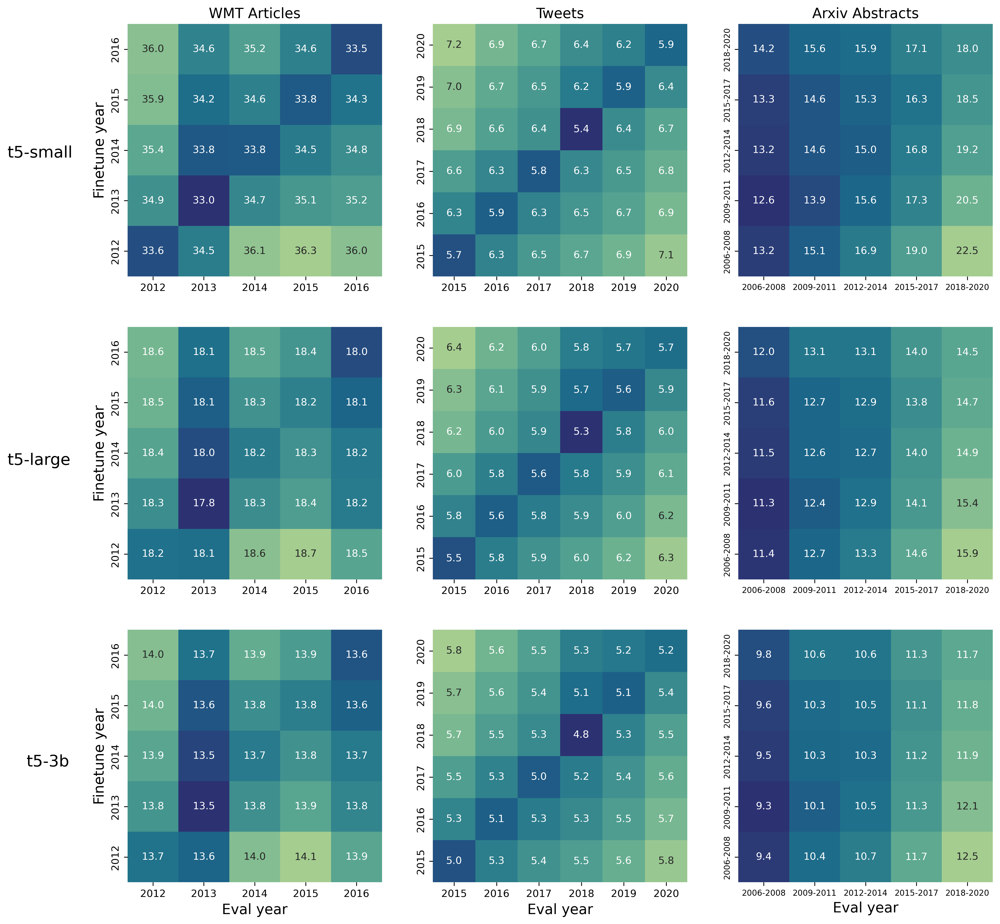

In [16]:
fig, axs = plt.subplots(3, 3, figsize=(15.5, 16))
#fig.suptitle("Language Modeling Loss Decrease From Pretrained T5 (%)", fontsize=18)
#fig.suptitle("Perplexity Change From Average On Eval Year (%)", fontsize=18)

vanilla_losses = np.array([[t5_small_wmt_vanilla_loss, t5_small_twitter_vanilla_loss, t5_small_arxiv_vanilla_loss],
                  [t5_large_wmt_vanilla_loss, t5_large_twitter_vanilla_loss, t5_large_arxiv_vanilla_loss],
                  [t5_3b_wmt_vanilla_loss, t5_3b_twitter_vanilla_loss, t5_3b_arxiv_vanilla_loss]])
lm_losses = np.array([[t5_small_wmt_lm_loss, t5_small_twitter_lm_loss, t5_small_arxiv_lm_loss],
             [t5_large_wmt_lm_loss, t5_large_twitter_lm_loss, t5_large_arxiv_lm_loss],
             [t5_3b_wmt_lm_loss, t5_3b_twitter_lm_loss, t5_3b_arxiv_lm_loss]])

heatmaps = lm_losses
#heatmaps = 100 * (vanilla_losses - lm_losses) / vanilla_losses

if len(heatmaps) == 1:
    axs = [axs]

for i in range(len(heatmaps)):
    heatmaps[i][0] = np.exp(heatmaps[i][0])
    #heatmaps[i][0] = 100 * (heatmaps[i][0] - np.mean(heatmaps[i][0], axis=0)) / np.mean(heatmaps[i][0], axis=0)
    ax = sns.heatmap(heatmaps[i][0], ax=axs[i][0], annot=True, fmt=".1f",
                    cmap="crest_r", cbar_kws={'label': 'Rouge-L'}, cbar=False,
                    )
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("WMT Articles", fontsize=14)
    ax.set_ylabel("Finetune year", fontsize=14)
    if i == 2  or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.set_yticklabels(list(range(2012, 2017)))
    ax.set_xticklabels(list(range(2012, 2017)))

    heatmaps[i][1] = np.exp(heatmaps[i][1])
    #heatmaps[i][1] = 100 * (heatmaps[i][1] - np.mean(heatmaps[i][1], axis=0)) / np.mean(heatmaps[i][1], axis=0)
    ax = sns.heatmap(heatmaps[i][1], ax=axs[i][1], annot=True, fmt=".1f",
                    cmap="crest_r", cbar_kws={'label': 'Macro F1'}, cbar=False,
                    )
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("Tweets", fontsize=14)
    if i == 2  or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.yaxis.set_tick_params(labelsize = 10)
    ax.xaxis.set_tick_params(labelsize = 10)
    ax.set_yticklabels(list(range(2015, 2021)))
    ax.set_xticklabels(list(range(2015, 2021)))

    heatmaps[i][2] = np.exp(heatmaps[i][2])
    #heatmaps[i][2] = 100 * (heatmaps[i][2] - np.mean(heatmaps[i][2], axis=0)) / np.mean(heatmaps[i][2], axis=0)
    ax = sns.heatmap(heatmaps[i][2], ax=axs[i][2], annot=True, fmt=".1f",
                    cmap="crest_r", cbar_kws={'label': 'Macro F1'}, cbar=False,
                    )
    ax.invert_yaxis()
    if i == 0:
        ax.set_title("Arxiv Abstracts", fontsize=14)
    if i == 2 or len(heatmaps) == 1:
        ax.set_xlabel("Eval year", fontsize=14)
    ax.yaxis.set_tick_params(labelsize = 8)
    ax.xaxis.set_tick_params(labelsize = 8)
    ax.set_yticklabels(["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"])
    ax.set_xticklabels(["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"])


plt.gcf().text(0.04, 0.21, "t5-3b", fontsize=16)
plt.gcf().text(0.023, 0.47, "t5-large", fontsize=16)
plt.gcf().text(0.023, 0.735, "t5-small", fontsize=16)
plt.subplots_adjust(top=0.85)
plt.subplots_adjust(left=0.13)
plt.show()




In [6]:
#plt.plot(np.diagonal(t5_small_wmt_lm_loss), label="t5-small wmt")
#plt.plot(np.diagonal(t5_large_wmt_lm_loss), label="t5-large wmt")
#plt.plot(np.diagonal(t5_3b_wmt_lm_loss), label="t5-3b wmt")

#plt.plot(norm_01(t5_small_arxiv_vanilla_loss), label="t5-small arxiv")
#plt.plot(norm_01(t5_large_arxiv_vanilla_loss), label="t5-large arxiv")
#plt.plot(norm_01(t5_3b_arxiv_vanilla_loss), label="t5-3b arxiv")

#plt.plot(norm_01(t5_small_twitter_vanilla_loss), label="t5-small twitter")
#plt.plot(norm_01(t5_large_twitter_vanilla_loss), label="t5-large twitter")
#plt.plot(norm_01(t5_3b_twitter_vanilla_loss), label="t5-3b twitter")
#plt.legend()
#plt.show()


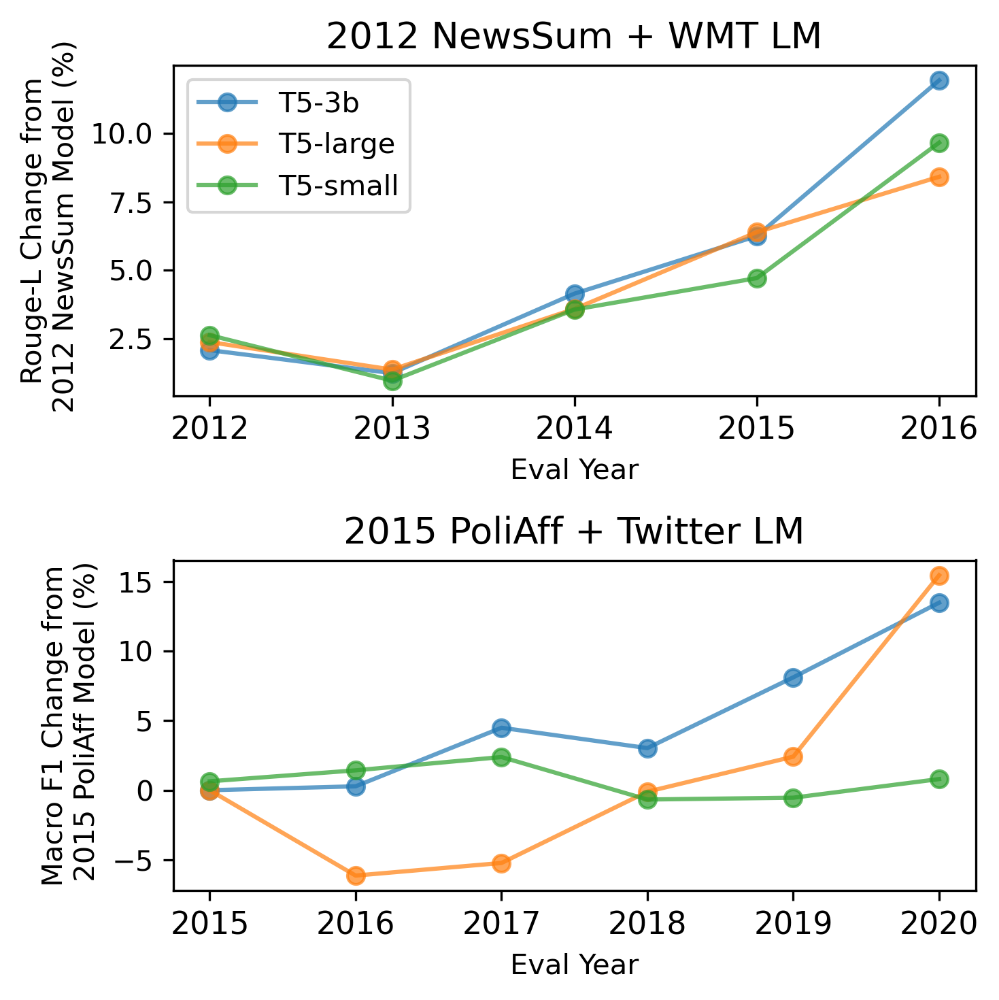

In [51]:
fig, axs = plt.subplots(2, 1, figsize=(5, 5))
axs = axs.flatten()

#fig.suptitle("T5 Task Analogy Improvement", fontsize=16)

x = list(range(5))
axs[0].set_title("2012 NewsSum + WMT LM", fontsize=13)
axs[0].plot(x, 100 * (t5_3b_news_sum_wmt_task_analogy - t5_3b_news_sum[0]) / t5_3b_news_sum[0], "o-", label="T5-3b", alpha=0.7)
axs[0].plot(x, 100 * (t5_large_news_sum_wmt_task_analogy - t5_large_news_sum[0]) / t5_large_news_sum[0], "o-", label="T5-large", alpha=0.7)
axs[0].plot(x, 100 * (t5_small_news_sum_wmt_task_analogy - t5_small_news_sum[0]) / t5_small_news_sum[0], "o-", label="T5-small", alpha=0.7)
axs[0].legend()
axs[0].set_ylabel("Rouge-L Change from\n 2012 NewsSum Model (%)")
axs[0].set_xticks(x, list(range(2012, 2017)), fontsize=11)
axs[0].set_xlabel("Eval Year", fontsize=10)

#axs[1].set_title("News Cls")
#axs[1].plot(x, 100 * (t5_3b_news_cls_wmt_task_analogy - t5_3b_news_cls[0]) / t5_3b_news_cls[0], "o-", label="t5-3b", alpha=0.7)
#axs[1].plot(x, 100 * (t5_large_news_cls_wmt_task_analogy - t5_large_news_cls[0]) / t5_large_news_cls[0], "o-", label="t5-large", alpha=0.7)
#axs[1].plot(x, 100 * (t5_small_news_cls_wmt_task_analogy - t5_small_news_cls[0]) / t5_small_news_cls[0], "o-", label="t5-small", alpha=0.7)
#axs[1].set_xticks(x, list(range(2012, 2017)))
#axs[1].set_xlabel("Eval Year")

#axs[3].set_title("AIC")
#axs[3].plot(x, 100 * (t5_3b_aic_arxiv_task_analogy - t5_3b_aic[0]) / t5_3b_aic[0], "o-", label="t5-3b", alpha=0.7)
#axs[3].plot(x, 100 * (t5_large_aic_arxiv_task_analogy - t5_large_aic[0]) / t5_large_aic[0], "o-", label="t5-large", alpha=0.7)
#axs[3].plot(x, 100 * (t5_small_aic_arxiv_task_analogy - t5_small_aic[0]) / t5_small_aic[0], "o-", label="t5-small", alpha=0.7)
#axs[3].set_xticks(x, ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"], fontsize=7)
#axs[3].set_xlabel("Eval Year")

x = list(range(6))
axs[1].set_title("2015 PoliAff + Twitter LM", fontsize=13)
axs[1].plot(x, 100 * (t5_3b_poli_aff_twitter_task_analogy - t5_3b_poli_aff[0]) / t5_3b_poli_aff[0], "o-", alpha=0.7)
axs[1].plot(x, 100 * (t5_large_poli_aff_twitter_task_analogy - t5_large_poli_aff[0]) / t5_large_poli_aff[0], "o-", alpha=0.7)
axs[1].plot(x, 100 * (t5_small_poli_aff_twitter_task_analogy - t5_small_poli_aff[0]) / t5_small_poli_aff[0], "o-", alpha=0.7)
axs[1].set_ylabel("Macro F1 Change from\n 2015 PoliAff Model (%)")
axs[1].set_xticks(x, list(range(2015, 2021)), fontsize=11)
axs[1].set_xlabel("Eval Year", fontsize=10)

axs[0].tick_params(axis='y', which='major')
axs[1].tick_params(axis='y', which='major')

fig.tight_layout()

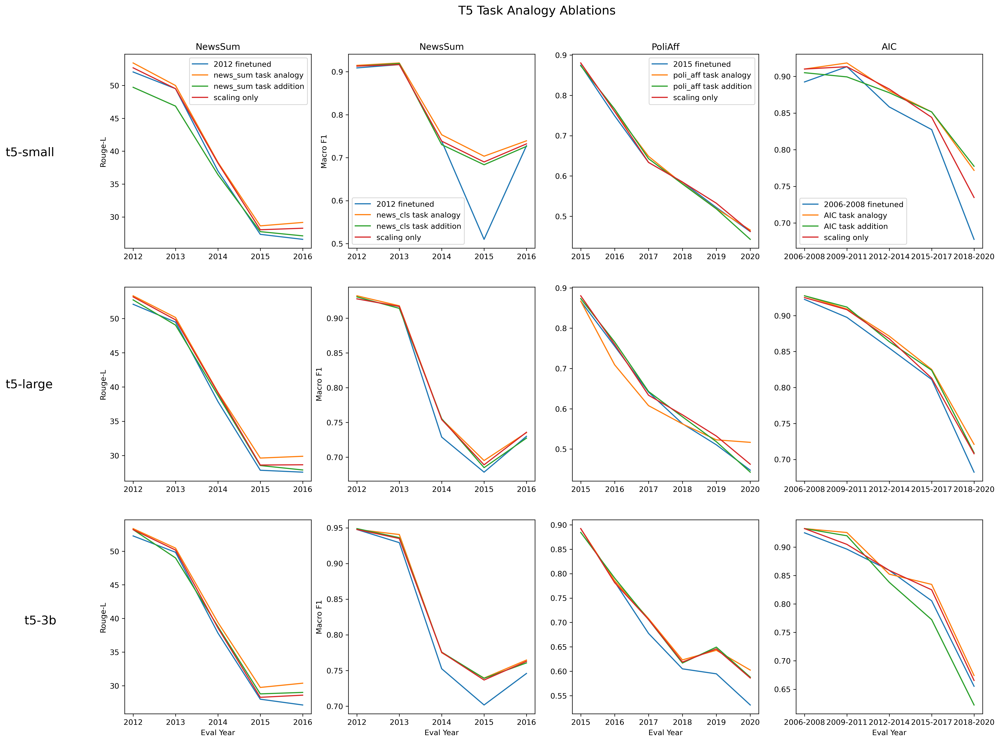

In [8]:
fig, axs = plt.subplots(3, 4, figsize=(20.5, 15))
fig.suptitle("T5 Task Analogy Ablations", fontsize=16)

aic_times = ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"]

# t5-small
x = list(range(5))
axs[0][0].plot(x, t5_small_news_sum[0], label="2012 finetuned")
axs[0][0].plot(x, t5_small_news_sum_wmt_task_analogy, label="news_sum task analogy")
axs[0][0].plot(x, t5_small_news_sum_wmt_task_addition, label="news_sum task addition")
axs[0][0].plot(x, t5_small_news_sum_scaling, label="scaling only")
axs[0][0].legend()
axs[0][0].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[0][0].set_ylabel("Rouge-L")
axs[0][0].set_title("NewsSum")

axs[0][1].plot(x, t5_small_news_cls[0], label="2012 finetuned")
axs[0][1].plot(x, t5_small_news_cls_wmt_task_analogy, label="news_cls task analogy")
axs[0][1].plot(x, t5_small_news_cls_wmt_task_addition, label="news_cls task addition")
axs[0][1].plot(x, t5_small_news_cls_scaling, label="scaling only")
axs[0][1].legend()
axs[0][1].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[0][1].set_ylabel("Macro F1")
axs[0][1].set_title("NewsSum")

x = list(range(6))
axs[0][2].plot(x, t5_small_poli_aff[0], label="2015 finetuned")
axs[0][2].plot(x, t5_small_poli_aff_twitter_task_analogy, label="poli_aff task analogy")
axs[0][2].plot(x, t5_small_poli_aff_twitter_task_addition, label="poli_aff task addition")
axs[0][2].plot(x, t5_small_poli_aff_scaling, label="scaling only")
axs[0][2].legend()
axs[0][2].set_xticks(ticks=x, labels=list(range(2015, 2021)))
axs[0][2].set_title("PoliAff")

x = list(range(5))
axs[0][3].plot(x, t5_small_aic[0], label="2006-2008 finetuned")
axs[0][3].plot(x, t5_small_aic_arxiv_task_analogy, label="AIC task analogy")
axs[0][3].plot(x, t5_small_aic_arxiv_task_addition, label="AIC task addition")
axs[0][3].plot(x, t5_small_aic_scaling, label="scaling only")
axs[0][3].legend()
axs[0][3].set_xticks(ticks=x, labels=aic_times)
axs[0][3].set_title("AIC")


# t5-large
axs[1][0].plot(x, t5_large_news_sum[0], label="2012 finetuned")
axs[1][0].plot(x, t5_large_news_sum_wmt_task_analogy, label="news_sum task analogy")
axs[1][0].plot(x, t5_large_news_sum_wmt_task_addition, label="news_sum task addition")
axs[1][0].plot(x, t5_large_news_sum_scaling, label="scaling only")
axs[1][0].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[1][0].set_ylabel("Rouge-L")

axs[1][1].plot(x, t5_large_news_cls[0], label="2012 finetuned")
axs[1][1].plot(x, t5_large_news_cls_wmt_task_analogy, label="news_cls task analogy")
axs[1][1].plot(x, t5_large_news_cls_wmt_task_addition, label="news_cls task addition")
axs[1][1].plot(x, t5_large_news_cls_scaling, label="scaling only")
axs[1][1].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[1][1].set_ylabel("Macro F1")

x = list(range(6))
axs[1][2].plot(x, t5_large_poli_aff[0], label="2015 finetuned")
axs[1][2].plot(x, t5_large_poli_aff_twitter_task_analogy, label="poli_aff task analogy")
axs[1][2].plot(x, t5_large_poli_aff_twitter_task_addition, label="poli_aff task addition")
axs[1][2].plot(x, t5_large_poli_aff_scaling, label="scaling only")
axs[1][2].set_xticks(ticks=x, labels=list(range(2015, 2021)))

x = list(range(5))
axs[1][3].plot(x, t5_large_aic[0], label="2006-2008 finetuned")
axs[1][3].plot(x, t5_large_aic_arxiv_task_analogy, label="AIC task analogy")
axs[1][3].plot(x, t5_large_aic_arxiv_task_addition, label="AIC task addition")
axs[1][3].plot(x, t5_large_aic_scaling, label="scaling only")
axs[1][3].set_xticks(ticks=x, labels=aic_times)

# t5-3b
axs[2][0].plot(x, t5_3b_news_sum[0], label="2012 finetuned")
axs[2][0].plot(x, t5_3b_news_sum_wmt_task_analogy, label="news_sum task analogy")
axs[2][0].plot(x, t5_3b_news_sum_wmt_task_addition, label="news_sum task addition")
axs[2][0].plot(x, t5_3b_news_sum_scaling, label="scaling only")
axs[2][0].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[2][0].set_xlabel("Eval Year")
axs[2][0].set_ylabel("Rouge-L")

axs[2][1].plot(x, t5_3b_news_cls[0], label="2012 finetuned")
axs[2][1].plot(x, t5_3b_news_cls_wmt_task_analogy, label="news_cls task analogy")
axs[2][1].plot(x, t5_3b_news_cls_wmt_task_addition, label="news_cls task addition")
axs[2][1].plot(x, t5_3b_news_cls_scaling, label="scaling only")
axs[2][1].set_xticks(ticks=x, labels=list(range(2012, 2017)))
axs[2][1].set_xlabel("Eval Year")
axs[2][1].set_ylabel("Macro F1")

x = list(range(6))
axs[2][2].plot(x, t5_3b_poli_aff[0], label="2015 finetuned")
axs[2][2].plot(x, t5_3b_poli_aff_twitter_task_analogy, label="poli_aff task analogy")
axs[2][2].plot(x, t5_3b_poli_aff_twitter_task_addition, label="poli_aff task addition")
axs[2][2].plot(x, t5_3b_poli_aff_scaling, label="scaling only")
axs[2][2].set_xticks(ticks=x, labels=list(range(2015, 2021)))
axs[2][2].set_xlabel("Eval Year")

x = list(range(5))
axs[2][3].plot(x, t5_3b_aic[0], label="2006-2008 finetuned")
axs[2][3].plot(x, t5_3b_aic_arxiv_task_analogy, label="AIC task analogy")
axs[2][3].plot(x, t5_3b_aic_arxiv_task_addition, label="AIC task addition")
axs[2][3].plot(x, t5_3b_aic_scaling, label="scaling only")
axs[2][3].set_xticks(ticks=x, labels=aic_times)
axs[2][3].set_xlabel("Eval Year")

plt.gcf().text(0.04, 0.22, "t5-3b", fontsize=16)
plt.gcf().text(0.023, 0.51, "t5-large", fontsize=16)
plt.gcf().text(0.023, 0.795, "t5-small", fontsize=16)
plt.subplots_adjust(top=0.92)
plt.subplots_adjust(left=0.13)

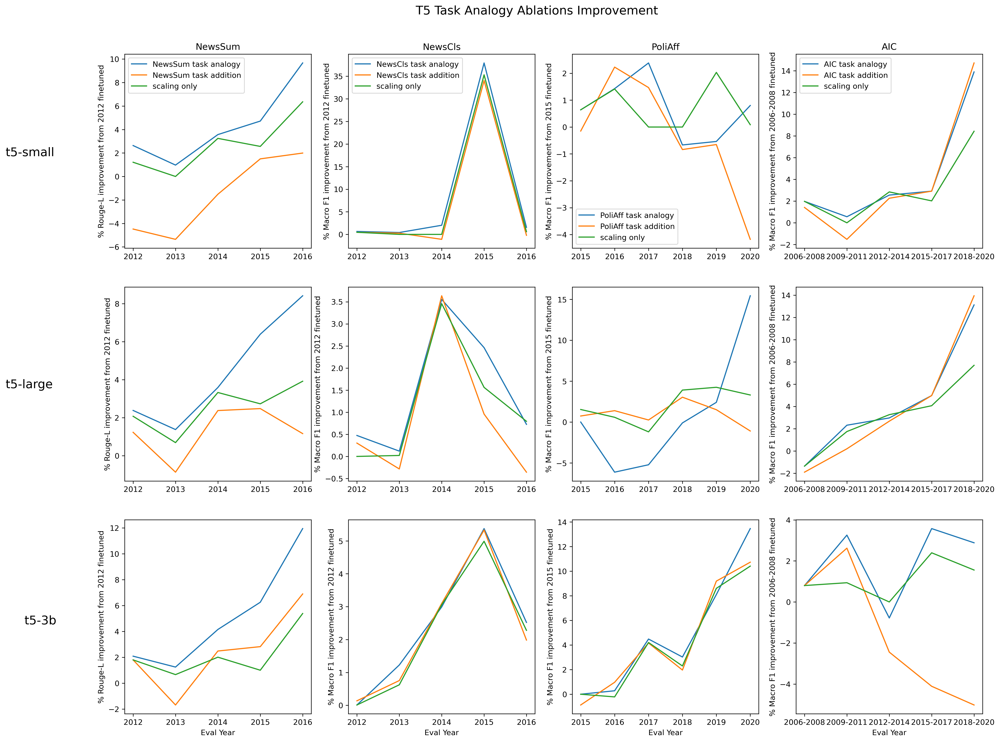

In [9]:
fig, axs = plt.subplots(3, 4, figsize=(20.5, 15))
fig.suptitle("T5 Task Analogy Ablations Improvement", fontsize=16)

finetuned_results = [[t5_small_news_sum[0], t5_small_news_cls[0], t5_small_poli_aff[0], t5_small_aic[0]],
                [t5_large_news_sum[0], t5_large_news_cls[0], t5_large_poli_aff[0], t5_large_aic[0]],
                [t5_3b_news_sum[0], t5_3b_news_cls[0], t5_3b_poli_aff[0], t5_3b_aic[0]]]

task_analogy_results = [[t5_small_news_sum_wmt_task_analogy, t5_small_news_cls_wmt_task_analogy, t5_small_poli_aff_twitter_task_analogy, t5_small_aic_arxiv_task_analogy],
                      [t5_large_news_sum_wmt_task_analogy, t5_large_news_cls_wmt_task_analogy, t5_large_poli_aff_twitter_task_analogy, t5_small_aic_arxiv_task_analogy],
                      [t5_3b_news_sum_wmt_task_analogy, t5_3b_news_cls_wmt_task_analogy, t5_3b_poli_aff_twitter_task_analogy, t5_3b_aic_arxiv_task_analogy]]

task_addition_results = [[t5_small_news_sum_wmt_task_addition, t5_small_news_cls_wmt_task_addition, t5_small_poli_aff_twitter_task_addition, t5_small_aic_arxiv_task_addition],
                       [t5_large_news_sum_wmt_task_addition, t5_large_news_cls_wmt_task_addition, t5_large_poli_aff_twitter_task_addition, t5_small_aic_arxiv_task_addition],
                       [t5_3b_news_sum_wmt_task_addition, t5_3b_news_cls_wmt_task_addition, t5_3b_poli_aff_twitter_task_addition, t5_3b_aic_arxiv_task_addition]]

scaling_results = [[t5_small_news_sum_scaling, t5_small_news_cls_scaling, t5_small_poli_aff_scaling, t5_small_aic_scaling],
                 [t5_large_news_sum_scaling, t5_large_news_cls_scaling, t5_large_poli_aff_scaling, t5_small_aic_scaling],
                 [t5_3b_news_sum_scaling, t5_3b_news_cls_scaling, t5_3b_poli_aff_scaling, t5_3b_aic_scaling]]

models = ["t5-small", "t5-large", "t5-3b"]
task_to_times = {
    "NewsSum": list(range(2012, 2017)),
    "NewsCls": list(range(2012, 2017)),
    "PoliAff": list(range(2015, 2021)),
    "AIC": ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"]}

for i, model in enumerate(models):
    for j, task in enumerate(task_to_times.keys()):
        if task == "NewsSum":
            metric = "Rouge-L"
        else:
            metric = "Macro F1"

        base_result = finetuned_results[i][j]
        x = list(range(len(base_result)))
        axs[i][j].plot(x, 100 * (task_analogy_results[i][j] - base_result) / base_result, label=f"{task} task analogy")
        axs[i][j].plot(x, 100 * (task_addition_results[i][j] - base_result) / base_result, label=f"{task} task addition")
        axs[i][j].plot(x, 100 * (scaling_results[i][j] - base_result) / base_result, label="scaling only")
        axs[i][j].set_xticks(ticks=x, labels=task_to_times[task])
        axs[i][j].set_ylabel(f"% {metric} improvement from {task_to_times[task][0]} finetuned")

        if i == 0:
            axs[i][j].set_title(f"{task}")
            axs[i][j].legend()
        elif i == 2:
            axs[i][j].set_xlabel("Eval Year")

plt.gcf().text(0.04, 0.22, "t5-3b", fontsize=16)
plt.gcf().text(0.023, 0.51, "t5-large", fontsize=16)
plt.gcf().text(0.023, 0.795, "t5-small", fontsize=16)
plt.subplots_adjust(top=0.92)
plt.subplots_adjust(left=0.13)

/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_67171/1818728147.py:113: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(["0.0"])


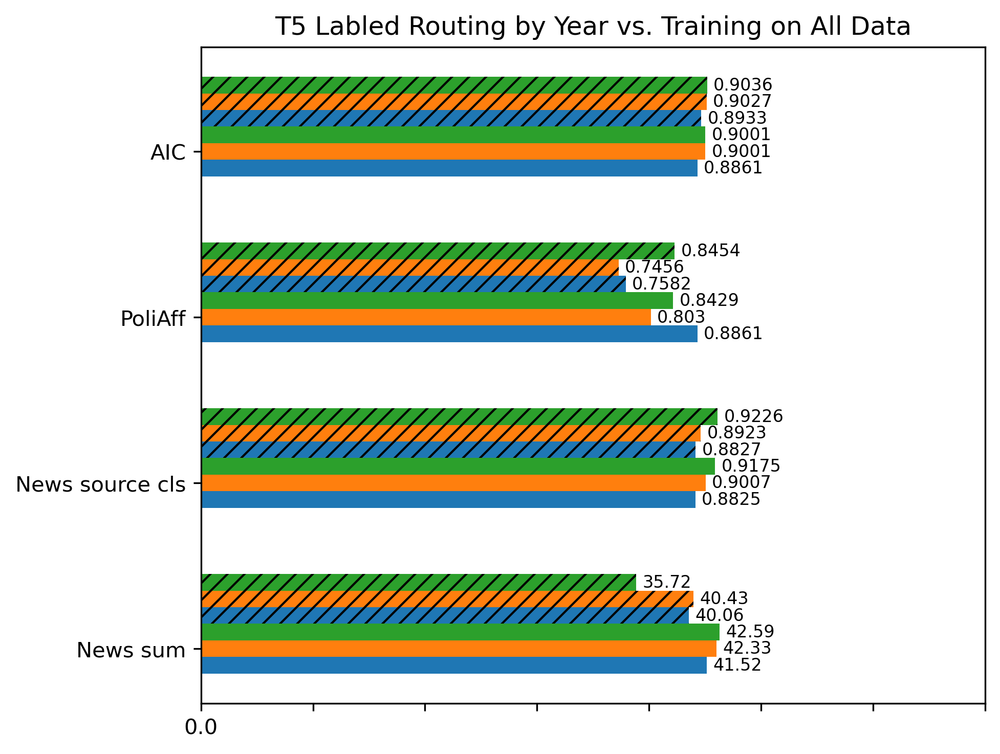

In [10]:
t5_small_labeled_routing_scores = np.array([t5_small_news_sum_labeled_routing,
                                   t5_small_news_cls_labeled_routing,
                                   t5_small_poli_aff_labeled_routing,
                                   t5_small_aic_labeled_routing,
                                   ])
t5_small_all_year_train_scores = np.array([np.mean(t5_small_all_year_train_news_sum),
                                  np.mean(t5_small_all_year_train_news_cls),
                                  np.mean(t5_small_all_year_train_poli_aff),
                                  np.mean(t5_small_all_year_train_aic),
                                  ])
t5_large_labeled_routing_scores = np.array([t5_large_news_sum_labeled_routing,
                                   t5_large_news_cls_labeled_routing,
                                   t5_large_poli_aff_labeled_routing,
                                   t5_large_aic_labeled_routing,
                                   ])
t5_large_all_year_train_scores = np.array([np.mean(t5_large_all_year_train_news_sum),
                                  np.mean(t5_large_all_year_train_news_cls),
                                  np.mean(t5_large_all_year_train_poli_aff),
                                  np.mean(t5_large_all_year_train_aic),
                                  ])
t5_3b_labeled_routing_scores = np.array([t5_3b_news_sum_labeled_routing,
                                   t5_3b_news_cls_labeled_routing,
                                   t5_3b_poli_aff_labeled_routing,
                                   t5_3b_aic_labeled_routing,
                                   ])
t5_3b_all_year_train_scores = np.array([np.mean(t5_3b_all_year_train_news_sum),
                                  np.mean(t5_3b_all_year_train_news_cls),
                                  np.mean(t5_3b_all_year_train_poli_aff),
                                  np.mean(t5_3b_all_year_train_aic),
                                  ])


t5_small_labeled_routing_scores = np.round(t5_small_labeled_routing_scores, 4)
t5_small_all_year_train_scores = np.round(t5_small_all_year_train_scores, 4)
t5_large_labeled_routing_scores = np.round(t5_large_labeled_routing_scores, 4)
t5_large_all_year_train_scores = np.round(t5_large_all_year_train_scores, 4)
t5_3b_labeled_routing_scores = np.round(t5_3b_labeled_routing_scores, 4)
t5_3b_all_year_train_scores = np.round(t5_3b_all_year_train_scores, 4)

t5_small_labeled_routing_scales = np.array(t5_small_labeled_routing_scores)
t5_small_all_year_train_scales = np.array(t5_small_all_year_train_scores)
t5_large_labeled_routing_scales = np.array(t5_large_labeled_routing_scores)
t5_large_all_year_train_scales = np.array(t5_large_all_year_train_scores)
t5_3b_labeled_routing_scales = np.array(t5_3b_labeled_routing_scores)
t5_3b_all_year_train_scales = np.array(t5_3b_all_year_train_scores)
t5_small_labeled_routing_scales[0] /= 46
t5_small_all_year_train_scales[0] /= 46
t5_large_labeled_routing_scales[0] /= 46
t5_large_all_year_train_scales[0] /= 46
t5_3b_labeled_routing_scales[0] /= 46
t5_3b_all_year_train_scales[0] /= 46

t5_small_labeled_routing_scores[0] = np.round(t5_small_labeled_routing_scores[0], 2)
t5_small_all_year_train_scores[0] = np.round(t5_small_all_year_train_scores[0], 2)
t5_large_labeled_routing_scores[0] = np.round(t5_large_labeled_routing_scores[0], 2)
t5_large_all_year_train_scores[0] = np.round(t5_large_all_year_train_scores[0], 2)
t5_3b_labeled_routing_scores[0] = np.round(t5_3b_labeled_routing_scores[0], 2)
t5_3b_all_year_train_scores[0] = np.round(t5_3b_all_year_train_scores[0], 2)

#scores_df = pd.DataFrame.from_dict({
#    "task": ["News sum", "News source cls", "AIC", "PoliAff"] * 6,
#    "type": (["T5-small Labeled routing"] * 4) + (["T5-small Training on all years"] * 4) + \
#            (["T5-large Labeled routing"] * 4) + (["T5-large Training on all years"] * 4) + \
#            (["T5-3b Labeled routing"] * 4) + (["T5-3b Training on all years"] * 4),
#    "score": np.concatenate((t5_small_labeled_routing_scores, t5_small_all_year_train_scores,
#                             t5_large_labeled_routing_scores, t5_large_all_year_train_scores,
#                             t5_3b_labeled_routing_scores, t5_3b_all_year_train_scores)),
#    "scale": np.concatenate((t5_small_labeled_routing_scales, t5_small_all_year_train_scales,
#                             t5_large_labeled_routing_scales, t5_large_all_year_train_scales,
#                             t5_3b_labeled_routing_scales, t5_3b_all_year_train_scales))
#})
#sns.set(style='white')
#sns.barplot(x='task', y='scale', hue='type', data=scores_df)

tasks = ["News sum", "News source cls", "PoliAff", "AIC"]
bar_scales = {
    'T5-small Labeled routing': t5_small_labeled_routing_scales,
    'T5-large Labeled routing': t5_large_labeled_routing_scales,
    'T5-3b Labeled routing': t5_3b_labeled_routing_scales,
    'T5-small Training on all years': t5_small_all_year_train_scales,
    'T5-large Training on all years': t5_large_all_year_train_scales,
    'T5-3b Training on all years': t5_3b_all_year_train_scales
}

x = np.arange(len(tasks))  # the label locations
width = 0.1  # the width of the bars

fig, ax = plt.subplots(layout='constrained')

bar_colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

multiplier = 0
bars = []
for attribute, measurement in list(bar_scales.items()):
    offset = width * multiplier
    if multiplier < 3:
        hatch = None
    else:
        hatch = "///"
    rects = ax.barh(x + offset, measurement, width, label=attribute, hatch=hatch, color=bar_colors[multiplier % len(bar_colors)])
    bars.append(rects)
    multiplier += 1

ax.bar_label(bars[0], labels=t5_small_labeled_routing_scores, padding=3, fontsize=8)
ax.bar_label(bars[1], labels=t5_large_labeled_routing_scores, padding=3, fontsize=8)
ax.bar_label(bars[2], labels=t5_3b_labeled_routing_scores, padding=3, fontsize=8)
ax.bar_label(bars[3], labels=t5_small_all_year_train_scores, padding=3, fontsize=8)
ax.bar_label(bars[4], labels=t5_large_all_year_train_scores, padding=3, fontsize=8)
ax.bar_label(bars[5], labels=t5_3b_all_year_train_scores, padding=3, fontsize=8)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title('T5 Labled Routing by Year vs. Training on All Data')
ax.set_xticklabels(["0.0"])
ax.set_yticks(x + width, tasks)
ax.set_xlim(0, 1.4)
#ax.legend(loc='upper right')
plt.show()


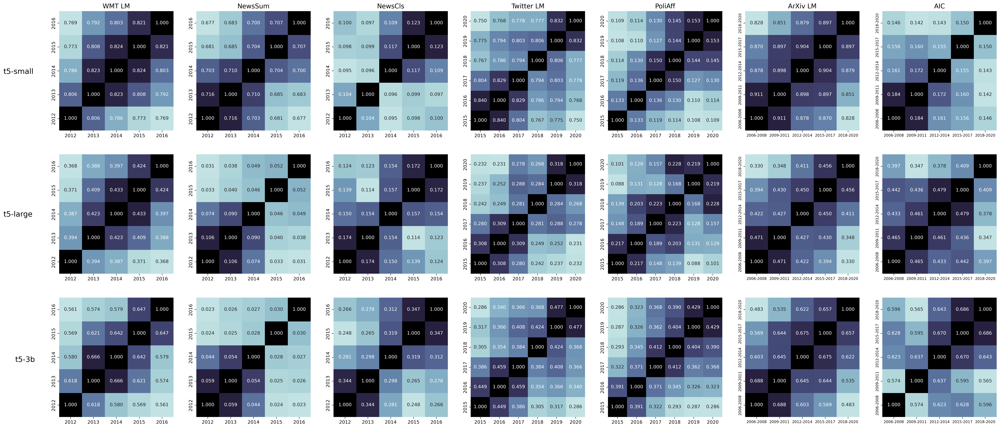

In [11]:
t5_small_distances = np.load("./data/t5-small_time_vec_distances.npy", allow_pickle=True).item()["t5-small"]
t5_large_distances = np.load("./data/t5-large_time_vec_distances.npy", allow_pickle=True).item()["t5-large"]
t5_3b_distances = np.load("./data/t5-3b_time_vec_distances.npy", allow_pickle=True).item()["t5-3b"]

arxiv_times = ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"]
heatmap_tasks = ["wmt_lm", "news_sum", "news_cls", "twitter_lm", "poli_aff", "arxiv_lm", "aic"]
heatmap_task_titles = ["WMT LM", "NewsSum", "NewsCls", "Twitter LM", "PoliAff", "ArXiv LM", "AIC"]
heatmap_task_times = [list(range(2012, 2017)), list(range(2012, 2017)), list(range(2012, 2017)), \
                      list(range(2015, 2021)), list(range(2015, 2021)), arxiv_times, arxiv_times]


for distance_metric in ["cos"]:
    fig, axs = plt.subplots(3, 7, figsize=(35.5, 15))
    axs = axs.flatten()
    #if distance_metric == "cos":
    #    fig.suptitle("T5 Time Vec Cosine Similarities", fontsize=18)
    #elif distance_metric == "l2":
    #    fig.suptitle("T5 Time l2 Distance", fontsize=18)

    for i, model_dists in enumerate([t5_small_distances, t5_large_distances, t5_3b_distances]):
        for j, task_name in enumerate(heatmap_tasks):
            time_vec_dists = model_dists[f"{task_name}_{distance_metric}_dist"]
            #time_vec_dists_corner = np.tril(time_vec_dists)
            time_vec_dists_corner = time_vec_dists
            #dist_min = np.min(time_vec_dists_corner[time_vec_dists_corner != 0])
            #dist_max = np.max(time_vec_dists_corner[time_vec_dists_corner != 1])
            #cmap = sns.color_palette("crest", as_cmap=True)
            #cmap = sns.cubehelix_palette(as_cmap=True)
            cmap = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
            cmap.set_over('black')
            #ax = sns.heatmap(time_vec_dists[:-1, 1:], ax=axs[i * len(model_dists) + j], annot=True, fmt=".3f",
            #                cmap=cmap, cbar_kws={'label': distance_metric + "distance"},
            #                cbar=False, vmin=dist_min, vmax=dist_max, mask=time_vec_dists_corner[:-1, 1:])
            ax = sns.heatmap(time_vec_dists, ax=axs[i * len(heatmap_tasks) + j], annot=True, fmt=".3f", cmap=cmap,
                             cbar=False, vmin=(np.min(time_vec_dists)), vmax=(np.max(time_vec_dists[time_vec_dists_corner != 1])))
            ax.invert_yaxis()
            if i == 0:
                ax.set_title(heatmap_task_titles[j], fontsize=14)
            #elif i == 2:
            #    ax.set_xlabel("Eval year", fontsize=14)
            #if j == 0:
            #    ax.set_ylabel("Finetune year", fontsize=14)

            ax.set_yticklabels(heatmap_task_times[j])#[:-1])
            ax.set_xticklabels(heatmap_task_times[j])#[1:])
            if task_name == "arxiv_lm" or task_name == "aic":
                ax.yaxis.set_tick_params(labelsize = 8)
                ax.xaxis.set_tick_params(labelsize = 8)

            #for _, spine in ax.spines.items():
            #    spine.set_visible(True)
            #    spine.set_linewidth(1)

    plt.gcf().text(0.073, 0.22, "t5-3b", fontsize=16)
    plt.gcf().text(0.063, 0.51, "t5-large", fontsize=16)
    plt.gcf().text(0.063, 0.795, "t5-small", fontsize=16)
    plt.subplots_adjust(top=0.92)
    plt.subplots_adjust(left=0.11)
    plt.show()

In [12]:
t5_small_distances = np.load("./data/t5-small_time_vec_distances.npy", allow_pickle=True).item()["t5-small"]
t5_large_distances = np.load("./data/t5-large_time_vec_distances.npy", allow_pickle=True).item()["t5-large"]
t5_3b_distances = np.load("./data/t5-3b_time_vec_distances.npy", allow_pickle=True).item()["t5-3b"]

models = ["t5-small", "t5-large", "t5-3b"]
tasks = ["wmt_lm", "news_sum", "news_cls", "twitter_lm", "poli_aff", "arxiv_lm", "aic"]

task_performances = [[t5_small_wmt_lm_loss, t5_small_news_sum, t5_small_news_cls, t5_small_twitter_lm_loss, t5_small_poli_aff, t5_small_arxiv_lm_loss, t5_small_aic],
                     [t5_large_wmt_lm_loss, t5_large_news_sum, t5_large_news_cls, t5_large_twitter_lm_loss, t5_large_poli_aff, t5_large_arxiv_lm_loss, t5_large_aic],
                     [t5_3b_wmt_lm_loss, t5_3b_news_sum, t5_3b_news_cls, t5_3b_twitter_lm_loss, t5_3b_poli_aff, t5_3b_arxiv_lm_loss, t5_3b_aic]]

print("Correlations between task degredation and time vec cosine similarity")
print("--------------------------------------------------------------------")
for i, model_dists in enumerate([t5_small_distances, t5_large_distances, t5_3b_distances]):
    for j, task_name in enumerate(tasks):
        time_vec_dists = model_dists[f"{task_name}_cos_dist"]
        cur_performances = task_performances[i][j]
        raw_correlation = np.corrcoef(time_vec_dists.flatten(), cur_performances.flatten())[0][1]

        raw_slope, raw_intercept, raw_r_value, raw_p_value, raw_std_err = scipy.stats.linregress(time_vec_dists.flatten(), cur_performances.flatten())
        pct_perf_diff = 100 * (cur_performances - np.mean(cur_performances, axis=0)) / np.mean(cur_performances, axis=0)
        pct_slope, pct_intercept, pct_r_value, pct_p_value, pct_std_err = scipy.stats.linregress(time_vec_dists.flatten(), pct_perf_diff.flatten())
        print(f"{models[i] :<10} {task_name :<10}: {round(raw_r_value, 3):>8}: {round(pct_r_value, 3):>8}: {round(raw_p_value, 10):>8}: {round(pct_p_value, 10):>8}")


Correlations between task degredation and time vec cosine similarity
--------------------------------------------------------------------
t5-small   wmt_lm    :   -0.803:   -0.867: 1.3457e-06: 1.99e-08
t5-small   news_sum  :    0.321:    0.663: 0.1182707633: 0.0002999513
t5-small   news_cls  :    0.493:    0.535: 0.0122658256: 0.0058410322
t5-small   twitter_lm:   -0.894:   -0.935:      0.0:      0.0
t5-small   poli_aff  :    0.644:    0.654: 2.27912e-05: 1.52806e-05
t5-small   arxiv_lm  :   -0.296:   -0.724: 0.151285071: 4.28437e-05
t5-small   aic       :    0.412:    0.492: 0.0406412328: 0.0125166172
t5-large   wmt_lm    :   -0.512:   -0.737: 0.0089053317: 2.61825e-05
t5-large   news_sum  :    0.308:    0.628: 0.1346403511: 0.0007681437
t5-large   news_cls  :    0.574:    0.706: 0.0026710838: 8.12983e-05
t5-large   twitter_lm:   -0.745:   -0.818: 1.913e-07:  1.1e-09
t5-large   poli_aff  :    0.658:    0.672: 1.28804e-05: 7.1219e-06
t5-large   arxiv_lm  :   -0.164:   -0.651: 0.4326354

In [13]:
print(f"{'t5-small' :<10} {'wmt_lm dist x news_sum' :<10}: {round(np.corrcoef(t5_small_distances['wmt_lm_cos_dist'].flatten(), t5_small_news_sum.flatten())[0][1], 3):>8}")
print(f"{'t5-small' :<10} {'wmt_lm dist x news_cls' :<10}: {round(np.corrcoef(t5_small_distances['wmt_lm_cos_dist'].flatten(), t5_small_news_cls.flatten())[0][1], 3):>8}")
print(f"{'t5-small' :<10} {'twitter_lm dist x poli_aff' :<10}: {round(np.corrcoef(t5_small_distances['twitter_lm_cos_dist'].flatten(), t5_small_poli_aff.flatten())[0][1], 3):>8}")
print(f"{'t5-small' :<10} {'arxiv_lm dist x aic' :<10}: {round(np.corrcoef(t5_small_distances['arxiv_lm_cos_dist'].flatten(), t5_small_aic.flatten())[0][1], 3):>8}")
print(f"{'t5-large' :<10} {'wmt_lm dist x news_sum' :<10}: {round(np.corrcoef(t5_large_distances['wmt_lm_cos_dist'].flatten(), t5_large_news_sum.flatten())[0][1], 3):>8}")
print(f"{'t5-large' :<10} {'wmt_lm dist x news_cls' :<10}: {round(np.corrcoef(t5_large_distances['wmt_lm_cos_dist'].flatten(), t5_large_news_cls.flatten())[0][1], 3):>8}")
print(f"{'t5-large' :<10} {'twitter_lm dist x poli_aff' :<10}: {round(np.corrcoef(t5_large_distances['twitter_lm_cos_dist'].flatten(), t5_large_poli_aff.flatten())[0][1], 3):>8}")
print(f"{'t5-large' :<10} {'arxiv_lm dist x aic' :<10}: {round(np.corrcoef(t5_large_distances['arxiv_lm_cos_dist'].flatten(), t5_large_aic.flatten())[0][1], 3):>8}")
print(f"{'t5-3b' :<10} {'wmt_lm dist x news_sum' :<10}: {round(np.corrcoef(t5_3b_distances['wmt_lm_cos_dist'].flatten(), t5_3b_news_sum.flatten())[0][1], 3):>8}")
print(f"{'t5-3b' :<10} {'wmt_lm dist x news_cls' :<10}: {round(np.corrcoef(t5_3b_distances['wmt_lm_cos_dist'].flatten(), t5_3b_news_cls.flatten())[0][1], 3):>8}")
print(f"{'t5-3b' :<10} {'twitter_lm dist x poli_aff' :<10}: {round(np.corrcoef(t5_3b_distances['twitter_lm_cos_dist'].flatten(), t5_3b_poli_aff.flatten())[0][1], 3):>8}")
print(f"{'t5-3b' :<10} {'arxiv_lm dist x aic' :<10}: {round(np.corrcoef(t5_3b_distances['arxiv_lm_cos_dist'].flatten(), t5_3b_aic.flatten())[0][1], 3):>8}")

t5-small   wmt_lm dist x news_sum:    0.279
t5-small   wmt_lm dist x news_cls:    0.553
t5-small   twitter_lm dist x poli_aff:     0.78
t5-small   arxiv_lm dist x aic:    0.604
t5-large   wmt_lm dist x news_sum:    0.266
t5-large   wmt_lm dist x news_cls:    0.571
t5-large   twitter_lm dist x poli_aff:    0.639
t5-large   arxiv_lm dist x aic:    0.459
t5-3b      wmt_lm dist x news_sum:    0.293
t5-3b      wmt_lm dist x news_cls:    0.587
t5-3b      twitter_lm dist x poli_aff:    0.679
t5-3b      arxiv_lm dist x aic:    0.516


/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_67171/1551487114.py:35: RuntimeWarning: Mean of empty slice
  col_mean = np.nanmean(wmt_monthly_perplexity, axis=0)


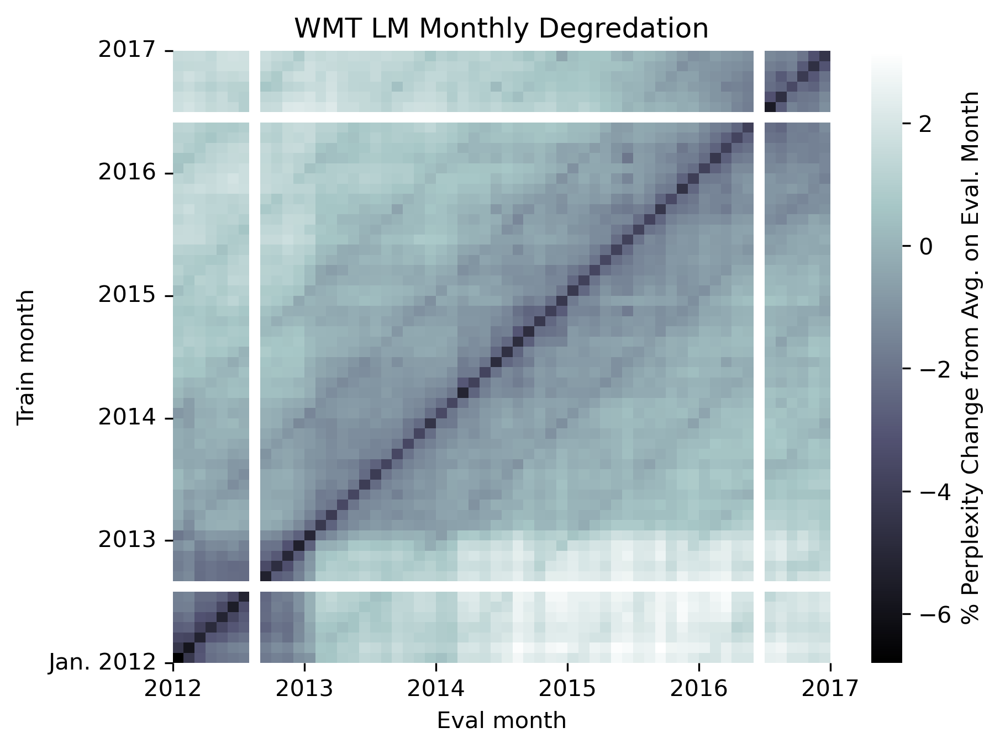

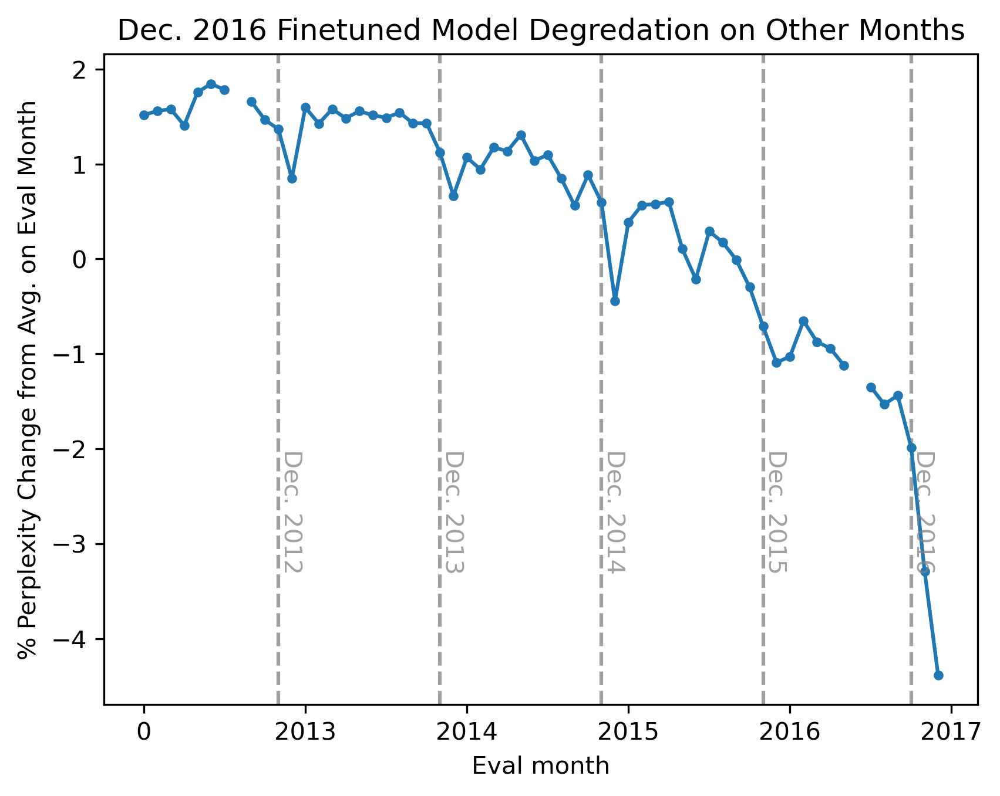

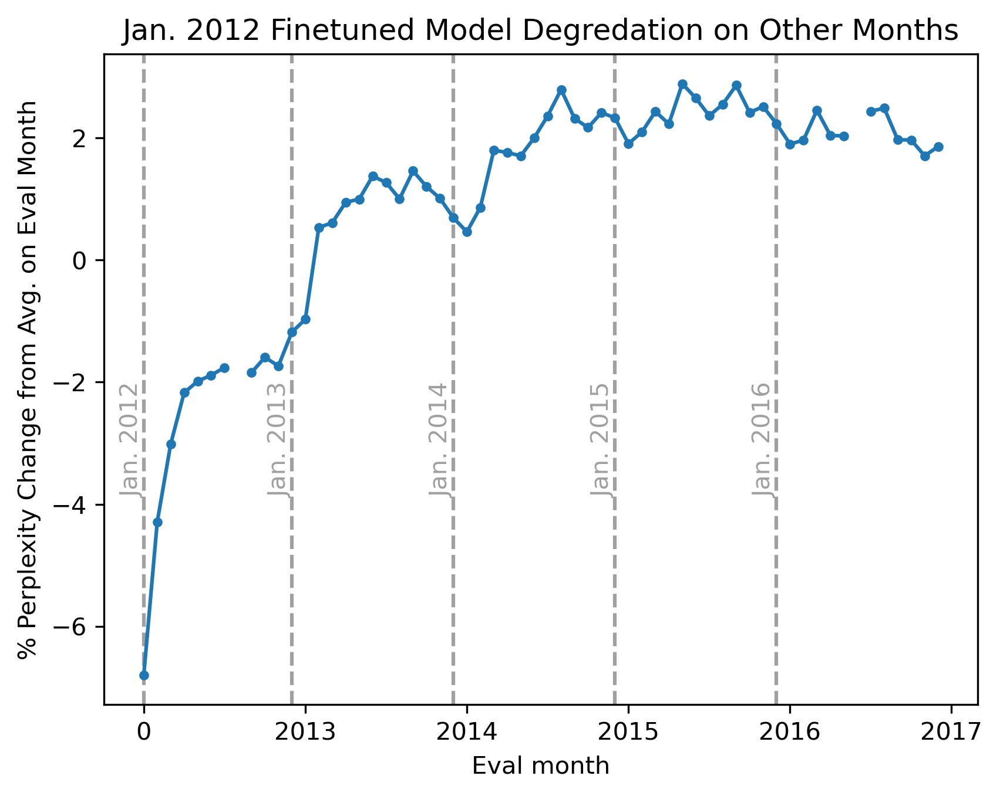

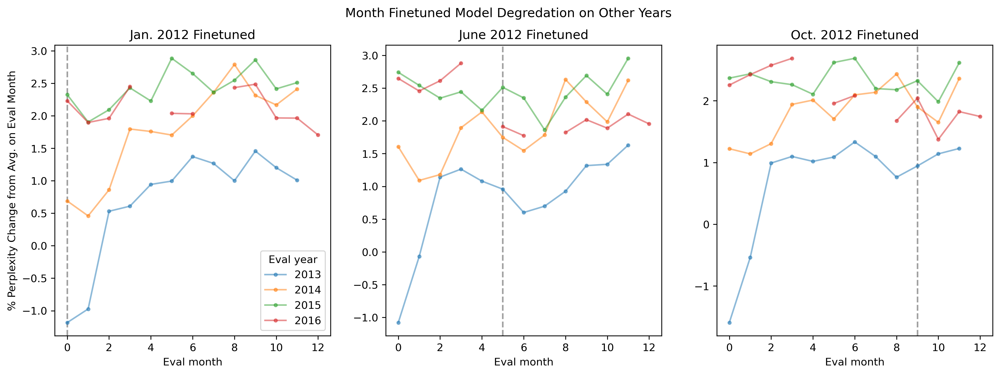

33.5431408456552
nan


In [14]:
wmt_monthly_evals = pd.read_json("./data/t5-small_wmt_monthly_eval", lines=True)

st_tr_year = 2012
st_ev_year = 2012

#wmt_monthly_evals = wmt_monthly_evals.sort_values(["train_year", "train_month", "eval_year", "eval_month"])
wmt_monthly_perplexity = np.empty((10 * 12, 10 * 12))
wmt_monthly_perplexity.fill(np.nan)
vanilla_evals = np.empty(10 * 12)
vanilla_evals.fill(np.nan)

for i, row in wmt_monthly_evals.iterrows():
    heatmap_col_idx = (int(row["eval_year"]) - st_ev_year) * 12 + int(row["eval_month"])
    if row["train_year"] == "none" and row["train_month"] == "none":
        vanilla_evals[heatmap_col_idx] = row["eval_loss"]
    else:
        heatmap_row_idx = (int(row["train_year"]) - st_tr_year) * 12 + int(row["train_month"])
        wmt_monthly_perplexity[heatmap_row_idx][heatmap_col_idx] = row["eval_loss"]

wmt_monthly_perplexity = wmt_monthly_perplexity[:60, :60]
#wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 7, axis=0)
#wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 7, axis=1)
#wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 52, axis=0)
#wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 52, axis=1)


vanilla_evals = vanilla_evals[:60]
vanilla_evals = np.delete(vanilla_evals, 7)
vanilla_evals = np.delete(vanilla_evals, 52)

#cmap = sns.cubehelix_palette(start=2, rot=0, dark=0, light=.95, reverse=True, as_cmap=True)
cmap="bone"
wmt_monthly_perplexity = np.exp(wmt_monthly_perplexity)
monthly_finetuned_jan_2012_evals = wmt_monthly_perplexity[:, 0]
col_mean = np.nanmean(wmt_monthly_perplexity, axis=0)
wmt_monthly_heatmap = 100 * (wmt_monthly_perplexity - col_mean) / col_mean
#wmt_monthly_heatmap = zscore(wmt_monthly_heatmap, axis=0)
#wmt_monthly_heatmap = 100 * (vanilla_evals - wmt_monthly_heatmap) / vanilla_evals

#np.fill_diagonal(wmt_monthly_heatmap, np.nan)


ax = sns.heatmap(wmt_monthly_heatmap, cmap=cmap, cbar_kws={'label': '% Perplexity Change from Avg. on Eval. Month'})
ax.invert_yaxis()
#ax.yaxis.set_tick_params(labelsize = 10)
#ax.xaxis.set_tick_params(labelsize = 10)
ticks = list(range(0, 61, 12))
tick_labels = list(range(2012, 2018))
ax.set_xticks(ticks=ticks, labels=tick_labels, rotation='horizontal')
tick_labels[0] = "Jan. 2012"
ax.set_yticks(ticks=ticks, labels=tick_labels, rotation='horizontal')

ax.set_ylabel("Train month")
ax.set_xlabel("Eval month")
ax.set_title("WMT LM Monthly Degredation")

#missing_idxs = np.where(np.isnan(wmt_monthly_heatmap))
#print("Total missing: " + str(len(missing_idxs[0])))
#print("missing train years: " + str(missing_idxs[0] // 12 + st_tr_year))
#print("missing train months: " + str(missing_idxs[0] % 12))
#print("missing eval years: " + str(missing_idxs[1] // 12 + st_ev_year))
#print("missing eval months: " + str(missing_idxs[1] % 12))

plt.show()

tick_labels[0] = 0
plt.xticks(ticks=ticks, labels=tick_labels, rotation='horizontal')
plt.axvline(x=10, color='gray', ls="--", alpha=0.75)
plt.axvline(x=22, color='gray', ls="--", alpha=0.75)
plt.axvline(x=34, color='gray', ls="--", alpha=0.75)
plt.axvline(x=46, color='gray', ls="--", alpha=0.75)
plt.axvline(x=57, color='gray', ls="--", alpha=0.75)
plt.text(10, -2, 'Dec. 2012', color='gray', ha='left', va='top', rotation=270, alpha=0.75)
plt.text(22, -2, 'Dec. 2013', color='gray', ha='left', va='top', rotation=270, alpha=0.75)
plt.text(34, -2, 'Dec. 2014', color='gray', ha='left', va='top', rotation=270, alpha=0.75)
plt.text(46, -2, 'Dec. 2015', color='gray', ha='left', va='top', rotation=270, alpha=0.75)
plt.text(57, -2, 'Dec. 2016', color='gray', ha='left', va='top', rotation=270, alpha=0.75)
plt.plot(wmt_monthly_heatmap[-1], "-o", ms=3)
plt.ylabel('% Perplexity Change from Avg. on Eval Month')
plt.xlabel("Eval month")
plt.title("Dec. 2016 Finetuned Model Degredation on Other Months")
plt.show()

plt.xticks(ticks=ticks, labels=tick_labels, rotation='horizontal')
plt.axvline(x=0, color='gray', ls="--", alpha=0.75)
plt.axvline(x=11, color='gray', ls="--", alpha=0.75)
plt.axvline(x=23, color='gray', ls="--", alpha=0.75)
plt.axvline(x=35, color='gray', ls="--", alpha=0.75)
plt.axvline(x=47, color='gray', ls="--", alpha=0.75)
plt.text(0, -2, 'Jan. 2012', color='gray', ha='right', va='top', rotation=90, alpha=0.75)
plt.text(11, -2, 'Jan. 2013', color='gray', ha='right', va='top', rotation=90, alpha=0.75)
plt.text(23, -2, 'Jan. 2014', color='gray', ha='right', va='top', rotation=90, alpha=0.75)
plt.text(35, -2, 'Jan. 2015', color='gray', ha='right', va='top', rotation=90, alpha=0.75)
plt.text(47, -2, 'Jan. 2016', color='gray', ha='right', va='top', rotation=90, alpha=0.75)
plt.plot(wmt_monthly_heatmap[0], "-o", ms=3)
plt.ylabel('% Perplexity Change from Avg. on Eval Month')
plt.xlabel("Eval month")
plt.title("Jan. 2012 Finetuned Model Degredation on Other Months")
plt.show()

#palette = sns.color_palette("hls", 6)
#c=palette[i - 1]

fig, axs = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Month Finetuned Model Degredation on Other Years")
axs = axs.flatten()

axs[0].set_title("Jan. 2012 Finetuned")
axs[0].axvline(x=0, color='gray', ls="--", alpha=0.75)
for year in range(2013, 2017):
    i = year - 2012
    month_evals = wmt_monthly_heatmap[0][(i * 12) - 1:((i + 1) * 12) - 1]
    if year == 2016:
        month_evals = np.insert(month_evals, 4, np.nan)
    axs[0].plot(month_evals, "-o", ms=3, label=year, alpha=0.5)
axs[0].legend(title="Eval year")
axs[0].set_xlabel("Eval month")
axs[0].set_ylabel('% Perplexity Change from Avg. on Eval Month')


axs[1].set_title("June 2012 Finetuned")
axs[1].axvline(x=5, color='gray', ls="--", alpha=0.75)
for year in range(2013, 2017):
    i = year - 2012
    month_evals = wmt_monthly_heatmap[5][(i * 12) - 1:((i + 1) * 12) - 1]
    if year == 2016:
        month_evals = np.insert(month_evals, 4, np.nan)
    axs[1].plot(month_evals, "-o", ms=3, label=year, alpha=0.5)
axs[1].set_xlabel("Eval month")


axs[2].set_title("Oct. 2012 Finetuned")
axs[2].axvline(x=9, color='gray', ls="--", alpha=0.75)
for year in range(2013, 2017):
    i = year - 2012
    month_evals = wmt_monthly_heatmap[8][(i * 12) - 1:((i + 1) * 12) - 1]
    if year == 2016:
        month_evals = np.insert(month_evals, 4, np.nan)
    axs[2].plot(month_evals, "-o", ms=3, label=year, alpha=0.5)
axs[2].set_xlabel("Eval month")
plt.show()


print(np.mean(np.diagonal(np.exp(t5_small_wmt_lm_loss))))
print(np.mean(np.diagonal(wmt_monthly_perplexity)))


0.8123666666666667
0.7161583333333333


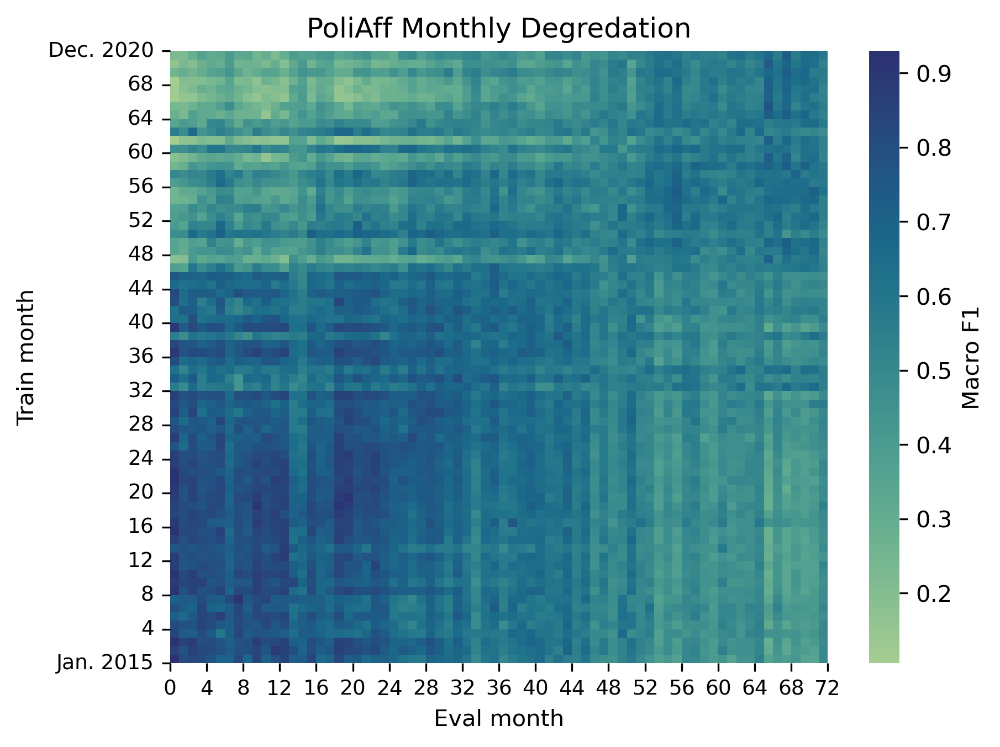

In [15]:
poli_aff_monthly_evals = pd.read_json("./data/t5-small_poli_aff_monthly_eval", lines=True)
poli_aff_monthly_evals["train_year"] = poli_aff_monthly_evals["train_year"].astype(int)
poli_aff_monthly_evals["train_month"] = poli_aff_monthly_evals["train_month"].astype(int)
poli_aff_monthly_evals["eval_year"] = poli_aff_monthly_evals["eval_year"].astype(int)
poli_aff_monthly_evals["eval_month"] = poli_aff_monthly_evals["eval_month"].astype(int)
poli_aff_train_years = np.sort(np.unique(poli_aff_monthly_evals["train_year"]))
poli_aff_train_months = np.sort(np.unique(poli_aff_monthly_evals["train_month"]))
poli_aff_eval_years = np.sort(np.unique(poli_aff_monthly_evals["eval_year"]))
poli_aff_eval_months = np.sort(np.unique(poli_aff_monthly_evals["eval_month"]))

n_ev_years = len(poli_aff_eval_years)
n_ev_months = len(poli_aff_eval_months)
st_tr_year = poli_aff_train_years[0]
st_ev_year = poli_aff_eval_years[0]

poli_aff_monthly_heatmap = np.zeros((len(poli_aff_train_years) * 12,
                                     len(poli_aff_eval_years) * 12))
for i, row in poli_aff_monthly_evals.iterrows():
    heatmap_row_idx = int((row["train_year"] - st_tr_year) * 12 + row["train_month"])
    heatmap_col_idx = int((row["eval_year"] - st_ev_year) * 12 + row["eval_month"])
    poli_aff_monthly_heatmap[heatmap_row_idx][heatmap_col_idx] = row["eval_micro_f1"]

col_mean = np.nanmean(poli_aff_monthly_heatmap, axis=0)
#row_mean = np.nanmean(poli_aff_monthly_heatmap, axis=1)
#poli_aff_monthly_heatmap = (poli_aff_monthly_heatmap - col_mean) / col_mean
#poli_aff_monthly_heatmap = ((poli_aff_monthly_heatmap.T - row_mean) / row_mean).T
ax = sns.heatmap(poli_aff_monthly_heatmap, cmap="crest", cbar_kws={'label': 'Macro F1'})
ax.invert_yaxis()

tick_labels = list(range(0, 76, 4))
ax.set_xticks(ticks=list(range(0, 76, 4)), labels=tick_labels, fontsize=9, rotation='horizontal')
tick_labels[-1] = "Dec. 2020"
tick_labels[0] = "Jan. 2015"
ax.set_yticks(ticks=list(range(0, 76, 4)), labels=tick_labels, fontsize=9)

ax.set_ylabel("Train month")
ax.set_xlabel("Eval month")
ax.set_title("PoliAff Monthly Degredation")

#wmt_monthly_heatmap[wmt_monthly_heatmap] = np.nan

#missing_idxs = np.where(poli_aff_monthly_heatmap == 0)
#print("Total missing: " + str(len(missing_idxs[0])))
#print("missing train years: " + str(missing_idxs[0] // 12 + st_tr_year))
#print("missing train months: " + str(missing_idxs[0] % 12))
#print("missing eval years: " + str(missing_idxs[1] // 12 + st_ev_year))
#print("missing eval months: " + str(missing_idxs[1] % 12))
print(np.mean(np.diagonal(t5_small_poli_aff)))
print(np.mean(np.diagonal(poli_aff_monthly_heatmap)))

In [ ]:
event_monthly_evals_df = pd.read_json("./data/t5-small_wmt_monthly_event_losses", lines=True)

st_tr_year = 2012

event_month_evals_dict = {}
event_year_evals_dict = {}

for i, row in event_monthly_evals_df.iterrows():
    event = row["eval_event"]
    if row["train_month"] == "none":
        train_time_idx = int(row["train_year"]) - st_tr_year
        if event in event_year_evals_dict:
            event_year_evals_dict[event][train_time_idx] = row["eval_loss"]
        else:
            year_evals = np.empty(10)
            year_evals.fill(np.nan)
            year_evals[train_time_idx] = row["eval_loss"]
            event_year_evals_dict[event] = year_evals
    else:
        train_time_idx = (int(row["train_year"]) - st_tr_year) * 12 + int(row["train_month"])

        if event in event_month_evals_dict:
            event_month_evals_dict[event][train_time_idx] = row["eval_loss"]
        else:
            month_evals = np.empty(12 * 10)
            month_evals.fill(np.nan)
            month_evals[train_time_idx] = row["eval_loss"]
            event_month_evals_dict[event] = month_evals


#for event, losses in event_year_evals_dict.items():
#    plt.title(event)
#    plt.plot(np.exp(losses))#[:5] / np.exp(t5_small_wmt_lm_loss[0]), label=event)
#    plt.show()


for event, losses in event_month_evals_dict.items():
    plt.title(event)
    losses = losses[:60]
    losses = np.delete(losses, 7)
    losses = np.delete(losses, 53)
    plt.plot(monthly_finetuned_jan_2012_evals, c="gray", alpha=0.5)
    #plt.plot(np.exp(losses), label=event)
    #plt.plot(np.exp(losses) / monthly_finetuned_jan_2012_evals)
    plt.plot(np.exp(losses))
    print(np.corrcoef([np.exp(losses)[:50], monthly_finetuned_jan_2012_evals[:50]])[0][1])
    plt.show()

/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_67171/4240697116.py:43: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


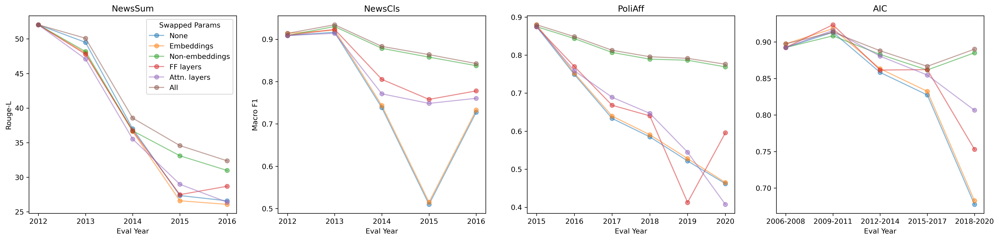

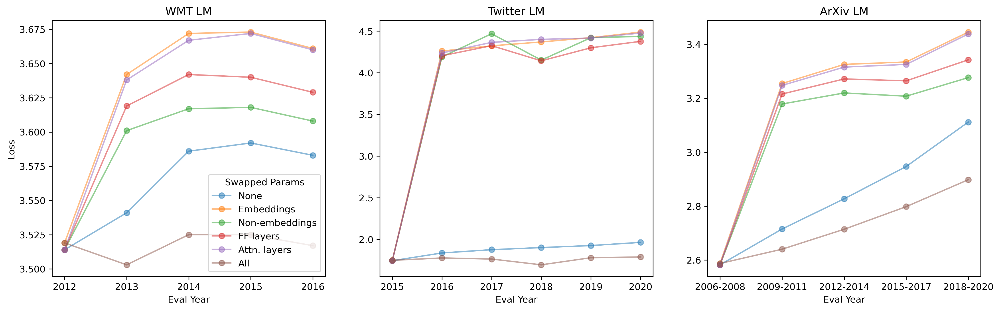

In [17]:
downstream_weight_swap_results = [
    [t5_small_news_sum[0], t5_small_news_sum_swapped_embeddings, t5_small_news_sum_swapped_non_embeddings, t5_small_news_sum_swapped_ff_layers, t5_small_news_sum_swapped_attn_layers, np.diagonal(t5_small_news_sum)],
    [t5_small_news_cls[0], t5_small_news_cls_swapped_embeddings, t5_small_news_cls_swapped_non_embeddings, t5_small_news_cls_swapped_ff_layers, t5_small_news_cls_swapped_attn_layers, np.diagonal(t5_small_news_cls)],
    [t5_small_poli_aff[0], t5_small_poli_aff_swapped_embeddings, t5_small_poli_aff_swapped_non_embeddings, t5_small_poli_aff_swapped_ff_layers, t5_small_poli_aff_swapped_attn_layers, np.diagonal(t5_small_poli_aff)],
    [t5_small_aic[0], t5_small_aic_swapped_embeddings, t5_small_aic_swapped_non_embeddings, t5_small_aic_swapped_ff_layers, t5_small_aic_swapped_attn_layers, np.diagonal(t5_small_aic)]
]
lm_weight_swap_results = [
    [t5_small_wmt_lm_loss[0], t5_small_wmt_lm_swapped_embeddings, t5_small_wmt_lm_swapped_non_embeddings, t5_small_wmt_lm_swapped_ff_layers, t5_small_wmt_lm_swapped_attn_layers, np.diagonal(t5_small_wmt_lm_loss)],
    [t5_small_twitter_lm_loss[0], t5_small_twitter_lm_swapped_embeddings, t5_small_twitter_lm_swapped_non_embeddings, t5_small_twitter_lm_swapped_ff_layers, t5_small_twitter_lm_swapped_attn_layers, np.diagonal(t5_small_twitter_lm_loss)],
    [t5_small_arxiv_lm_loss[0], t5_small_arxiv_lm_swapped_embeddings, t5_small_arxiv_lm_swapped_non_embeddings, t5_small_arxiv_lm_swapped_ff_layers, t5_small_arxiv_lm_swapped_attn_layers, np.diagonal(t5_small_arxiv_lm_loss)]
]
lm_titles = ["WMT LM", "Twitter LM", "ArXiv LM"]
downstream_titles = ["NewsSum", "NewsCls", "PoliAff", "AIC"]
arxiv_times = ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"]
lm_times = [list(range(2012, 2017)), list(range(2015, 2021)), arxiv_times]
downstream_times = [list(range(2012, 2017)), list(range(2012, 2017)), list(range(2015, 2021)), arxiv_times]

for results, titles, times in [(downstream_weight_swap_results, downstream_titles, downstream_times),
                               (lm_weight_swap_results, lm_titles, lm_times)]:
    num_plots = len(titles)
    fig, axs = plt.subplots(1, num_plots, figsize=(num_plots * 6, 5))
    axs = axs.flatten()

    for i in range(len(titles)):
        axs[i].plot(results[i][0], "-o", alpha=0.5, label="None")
        axs[i].plot(results[i][1] + 0.005, "-o", alpha=0.5, label="Embeddings")
        axs[i].plot(results[i][2], "-o", alpha=0.5, label="Non-embeddings")
        axs[i].plot(results[i][3], "-o", alpha=0.5, label="FF layers")
        axs[i].plot(results[i][4], "-o", alpha=0.5, label="Attn. layers")
        axs[i].plot(results[i][5] + 0.005, "-o", alpha=0.5, label="All")
        axs[i].set_xticks(ticks=list(range(len(times[i]))), labels=times[i])
        axs[i].set_xlabel("Eval Year")
        axs[i].set_title(titles[i])

    axs[0].legend(title="Swapped Params")

    if "WMT LM" in titles:
        axs[0].set_ylabel("Loss")
    elif "NewsSum" in titles:
        axs[0].set_ylabel("Rouge-L")
        axs[1].set_ylabel("Macro F1")

    fig.show()

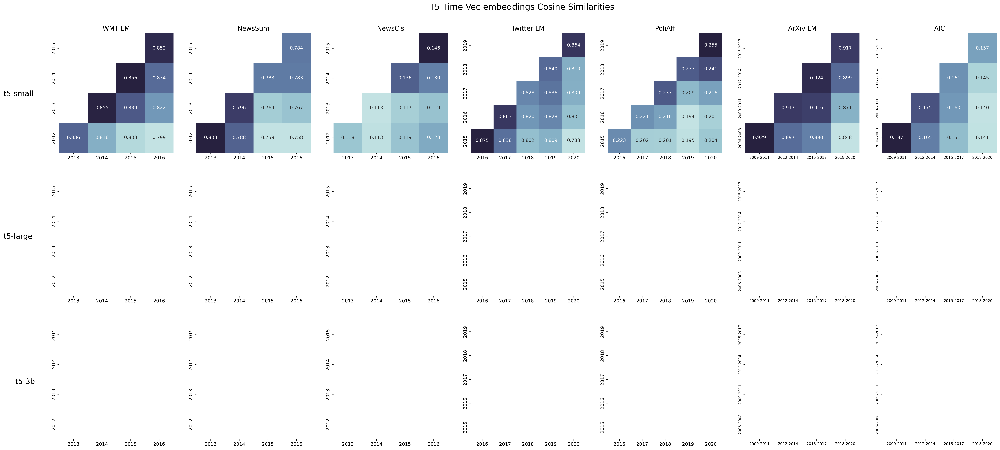

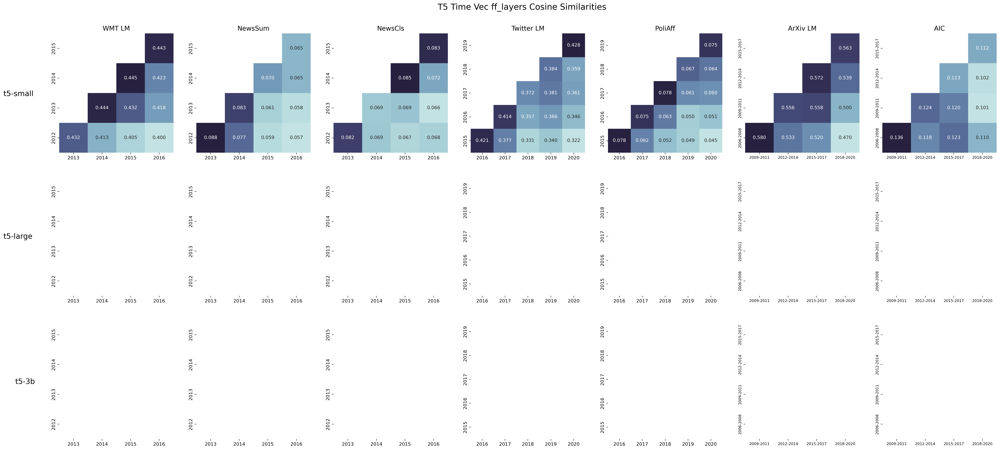

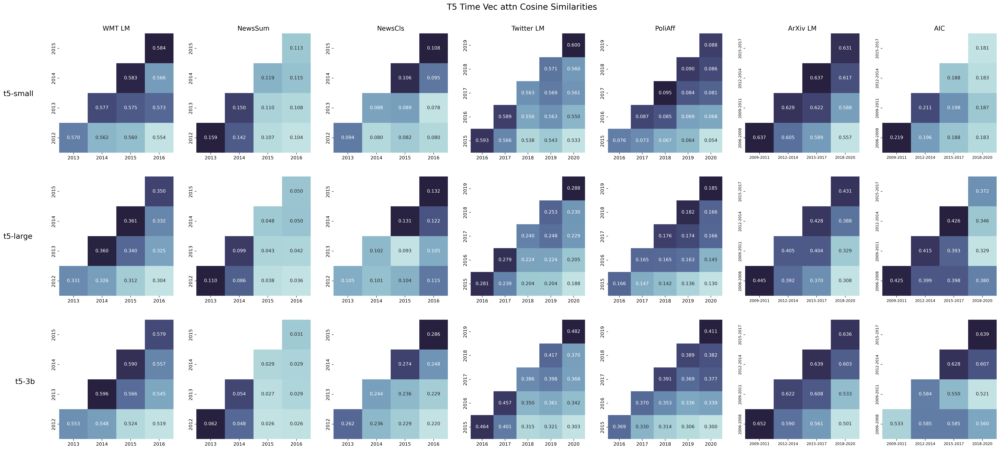

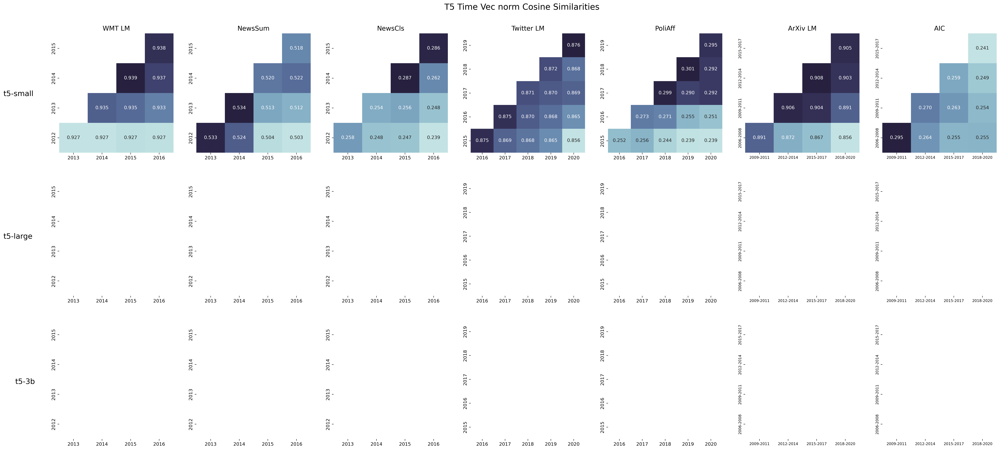

In [18]:
t5_small_param_distances = np.load("./data/t5-small_param_time_vec_distances.npy", allow_pickle=True).item()
t5_large_param_distances = np.load("./data/t5-large_param_time_vec_distances.npy", allow_pickle=True).item()
t5_3b_param_distances = np.load("./data/t5-3b_param_time_vec_distances.npy", allow_pickle=True).item()

arxiv_times = ["2006-2008", "2009-2011", "2012-2014", "2015-2017", "2018-2020"]
heatmap_tasks = ["wmt_lm", "news_sum", "news_cls", "twitter_lm", "poli_aff", "arxiv_lm", "aic"]
heatmap_task_titles = ["WMT LM", "NewsSum", "NewsCls", "Twitter LM", "PoliAff", "ArXiv LM", "AIC"]
heatmap_task_times = [list(range(2012, 2017)), list(range(2012, 2017)), list(range(2012, 2017)), \
                      list(range(2015, 2021)), list(range(2015, 2021)), arxiv_times, arxiv_times]


for param in ["embeddings", "ff_layers", "attn", "norm"]:
    t5_small_distances = t5_small_param_distances[param]
    t5_large_distances = t5_large_param_distances[param]
    t5_3b_distances = t5_3b_param_distances[param]

    fig, axs = plt.subplots(3, 7, figsize=(35.5, 15))
    fig.suptitle(f"T5 Time Vec {param} Cosine Similarities", fontsize=18)

    for i, model_dists in enumerate([t5_small_distances, t5_large_distances, t5_3b_distances]):
        for j, task_name in enumerate(heatmap_tasks):
            time_vec_dists = model_dists[f"{task_name}_cos_dist"]
            time_vec_dists_corner = np.tril(time_vec_dists)
            dist_min = np.min(time_vec_dists_corner[time_vec_dists_corner != 0])
            dist_max = np.max(time_vec_dists_corner[time_vec_dists_corner != 1])
            #cmap = sns.color_palette("crest", as_cmap=True)
            #cmap = sns.cubehelix_palette(as_cmap=True)
            cmap = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
            cmap.set_over('black')
            ax = sns.heatmap(time_vec_dists[:-1, 1:], ax=axs[i][j], annot=True, fmt=".3f",
                            cmap=cmap, cbar_kws={'label': "cos distance"},
                            cbar=False, vmin=dist_min, vmax=dist_max, mask=time_vec_dists_corner[:-1, 1:])
            ax.invert_yaxis()
            if i == 0:
                ax.set_title(heatmap_task_titles[j], fontsize=14)
            #elif i == 2:
            #    ax.set_xlabel("Eval year", fontsize=14)
            #if j == 0:
            #    ax.set_ylabel("Finetune year", fontsize=14)

            ax.set_yticklabels(heatmap_task_times[j][:-1])
            ax.set_xticklabels(heatmap_task_times[j][1:])
            if task_name == "arxiv_lm" or task_name == "aic":
                ax.yaxis.set_tick_params(labelsize = 8)
                ax.xaxis.set_tick_params(labelsize = 8)

            #for _, spine in ax.spines.items():
            #    spine.set_visible(True)
            #    spine.set_linewidth(1)

    plt.gcf().text(0.073, 0.22, "t5-3b", fontsize=16)
    plt.gcf().text(0.063, 0.51, "t5-large", fontsize=16)
    plt.gcf().text(0.063, 0.795, "t5-small", fontsize=16)
    plt.subplots_adjust(top=0.92)
    plt.subplots_adjust(left=0.11)
    plt.show()

In [19]:
#slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
print("Task TD results")

t5_small_task_to_results = {
    "wmt_lm": np.exp(t5_small_wmt_lm_loss),
    "news_sum": t5_small_news_sum,
    "news_cls": t5_small_news_cls,
    "twitter_lm": np.exp(t5_small_twitter_lm_loss),
    "poli_aff": t5_small_poli_aff,
    "arxiv_lm": np.exp(t5_small_arxiv_lm_loss),
    "aic": t5_small_aic
}
t5_large_task_to_results = {
    "wmt_lm": np.exp(t5_large_wmt_lm_loss),
    "news_sum": t5_large_news_sum,
    "news_cls": t5_large_news_cls,
    "twitter_lm": np.exp(t5_large_twitter_lm_loss),
    "poli_aff": t5_large_poli_aff,
    "arxiv_lm": np.exp(t5_large_arxiv_lm_loss),
    "aic": t5_large_aic
}
t5_3b_task_to_results = {
    "wmt_lm": np.exp(t5_3b_wmt_lm_loss),
    "news_sum": t5_3b_news_sum,
    "news_cls": t5_3b_news_cls,
    "twitter_lm": np.exp(t5_3b_twitter_lm_loss),
    "poli_aff": t5_3b_poli_aff,
    "arxiv_lm": np.exp(t5_3b_arxiv_lm_loss),
    "aic": t5_3b_aic
}
model_to_task_res = {
    "t5-small": t5_small_task_to_results,
    "t5-large": t5_large_task_to_results,
    "t5-3b": t5_3b_task_to_results
}

print(f"{'Model' :<10} {'Task' :<10} : {'TD Score' :<10}: {'TD R^2' :<10}: {'TD p' :<8}")
for model, task_results in model_to_task_res.items():
    print("---------------------------------------------------------")
    for task, res in task_results.items():
        d = np.zeros(res.shape)
        td = np.zeros(res.shape[0])
        td_r2 = np.zeros(res.shape[0])
        td_p = np.zeros(res.shape[0])
        for i in range(len(res)):
            for j in range(len(res[0])):
                d[i][j] = -(res[i][j] - res[i][i]) * math.copysign(1, j - i)

        for i in range(len(res)):
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(list(range(len(res[0]))), d[i])
            td[i] = slope
            td_r2[i] = r_value ** 2
            td_p[i] = p_value
        print(f"{model :<10} {task :<10} : {round(np.mean(td), 5) :<10}: {round(np.mean(td_r2), 5):<10}: {round(np.mean(td_p), 5):>8}")

Task TD results
Model      Task       : TD Score  : TD R^2    : TD p    
---------------------------------------------------------
t5-small   wmt_lm     : -0.66641  : 0.80648   :  0.03956
t5-small   news_sum   : 2.2132    : 0.50537   :  0.36296
t5-small   news_cls   : 0.04553   : 0.66613   :   0.1238
t5-small   twitter_lm : -0.34577  : 0.96882   :  0.00051
t5-small   poli_aff   : 0.07889   : 0.97881   :   0.0002
t5-small   arxiv_lm   : -0.59372  : 0.6549    :  0.15638
t5-small   aic        : 0.03361   : 0.54699   :  0.23268
---------------------------------------------------------
t5-large   wmt_lm     : -0.09841  : 0.33503   :  0.41522
t5-large   news_sum   : 2.0666    : 0.53219   :  0.32244
t5-large   news_cls   : 0.03954   : 0.61172   :  0.20623
t5-large   twitter_lm : -0.19712  : 0.97348   :  0.00038
t5-large   poli_aff   : 0.07408   : 0.97124   :  0.00035
t5-large   arxiv_lm   : -0.20006  : 0.67141   :  0.12822
t5-large   aic        : 0.02584   : 0.49822   :  0.27398
-------------

In [20]:
#slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
print("Task TD diff from mean results")

t5_small_task_to_results = {
    "wmt_lm": np.exp(t5_small_wmt_lm_loss),
    "news_sum": t5_small_news_sum,
    "news_cls": t5_small_news_cls,
    "twitter_lm": np.exp(t5_small_twitter_lm_loss),
    "poli_aff": t5_small_poli_aff,
    "arxiv_lm": np.exp(t5_small_arxiv_lm_loss),
    "aic": t5_small_aic
}
t5_large_task_to_results = {
    "wmt_lm": np.exp(t5_large_wmt_lm_loss),
    "news_sum": t5_large_news_sum,
    "news_cls": t5_large_news_cls,
    "twitter_lm": np.exp(t5_large_twitter_lm_loss),
    "poli_aff": t5_large_poli_aff,
    "arxiv_lm": np.exp(t5_large_arxiv_lm_loss),
    "aic": t5_large_aic
}
t5_3b_task_to_results = {
    "wmt_lm": np.exp(t5_3b_wmt_lm_loss),
    "news_sum": t5_3b_news_sum,
    "news_cls": t5_3b_news_cls,
    "twitter_lm": np.exp(t5_3b_twitter_lm_loss),
    "poli_aff": t5_3b_poli_aff,
    "arxiv_lm": np.exp(t5_3b_arxiv_lm_loss),
    "aic": t5_3b_aic
}
model_to_task_res = {
    "t5-small": t5_small_task_to_results,
    "t5-large": t5_large_task_to_results,
    "t5-3b": t5_3b_task_to_results
}

print(f"{'Model' :<10} {'Task' :<10} : {'TD Score' :<10}: {'TD R^2' :<10}: {'TD p' :<8}")
for model, task_results in model_to_task_res.items():
    print("---------------------------------------------------------")
    for task, res in task_results.items():
        d = np.zeros(res.shape)
        td = np.zeros(res.shape[0])
        td_r2 = np.zeros(res.shape[0])
        td_p = np.zeros(res.shape[0])

        col_mean = np.nanmean(res, axis=0)
        res = 100 * (res - col_mean) / col_mean

        for i in range(len(res)):
            for j in range(len(res[0])):
                d[i][j] = -(res[i][j] - res[i][i]) * math.copysign(1, j - i)

        for i in range(len(res)):
            slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(list(range(len(res[0]))), d[i])
            td[i] = slope
            td_r2[i] = r_value ** 2
            td_p[i] = p_value
        print(f"{model :<10} {task :<10} : {round(np.mean(td), 5) :<10}: {round(np.mean(td_r2), 5):<10}: {round(np.mean(td_p), 5):>8}")

Task TD diff from mean results
Model      Task       : TD Score  : TD R^2    : TD p    
---------------------------------------------------------
t5-small   wmt_lm     : -1.70221  : 0.90439   :  0.02031
t5-small   news_sum   : 6.98713   : 0.87168   :  0.02367
t5-small   news_cls   : 6.4322    : 0.74143   :   0.0763
t5-small   twitter_lm : -4.51693  : 0.88816   :   0.0057
t5-small   poli_aff   : 10.47124  : 0.94572   :  0.00174
t5-small   arxiv_lm   : -2.61436  : 0.93513   :  0.00795
t5-small   aic        : 2.93365   : 0.56905   :  0.21413
---------------------------------------------------------
t5-large   wmt_lm     : -0.55868  : 0.91922   :  0.01566
t5-large   news_sum   : 6.26804   : 0.89315   :  0.01589
t5-large   news_cls   : 5.33303   : 0.83802   :  0.03388
t5-large   twitter_lm : -2.6411   : 0.91051   :  0.00419
t5-large   poli_aff   : 9.56824   : 0.94298   :  0.00179
t5-large   arxiv_lm   : -1.24273  : 0.9284    :  0.00972
t5-large   aic        : 2.52588   : 0.51429   :  0.2684

In [21]:
wmt_monthly_evals = pd.read_json("./data/t5-small_wmt_monthly_eval", lines=True)

st_tr_year = 2012
st_ev_year = 2012

#wmt_monthly_evals = wmt_monthly_evals.sort_values(["train_year", "train_month", "eval_year", "eval_month"])
wmt_monthly_perplexity = np.empty((10 * 12, 10 * 12))
wmt_monthly_perplexity.fill(np.nan)
vanilla_evals = np.empty(10 * 12)
vanilla_evals.fill(np.nan)

for i, row in wmt_monthly_evals.iterrows():
    heatmap_col_idx = (int(row["eval_year"]) - st_ev_year) * 12 + int(row["eval_month"])
    if row["train_year"] == "none" and row["train_month"] == "none":
        vanilla_evals[heatmap_col_idx] = row["eval_loss"]
    else:
        heatmap_row_idx = (int(row["train_year"]) - st_tr_year) * 12 + int(row["train_month"])
        wmt_monthly_perplexity[heatmap_row_idx][heatmap_col_idx] = row["eval_loss"]

wmt_monthly_perplexity = wmt_monthly_perplexity[:60, :60]
wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 7, axis=0)
wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 7, axis=1)
wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 52, axis=0)
wmt_monthly_perplexity = np.delete(wmt_monthly_perplexity, 52, axis=1)
wmt_monthly_perplexity = np.exp(wmt_monthly_perplexity)
col_mean = np.nanmean(wmt_monthly_perplexity, axis=0)
wmt_monthly_heatmap = 100 * (wmt_monthly_perplexity - col_mean) / col_mean

res = wmt_monthly_heatmap
d = np.zeros(res.shape)
td = np.zeros(res.shape[0])
td_r2 = np.zeros(res.shape[0])
td_p = np.zeros(res.shape[0])
for i in range(len(res)):
    for j in range(len(res[0])):
        d[i][j] = -(res[i][j] - res[i][i]) * math.copysign(1, j - i)
    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(list(range(len(res[0]))), d[i])
    td[i] = slope
    td_r2[i] = r_value ** 2
    td_p[i] = p_value
print(f"{'t5-small' :<10} {'monthly wmt lm' :<10} : {round(np.mean(td), 5) :<10}: {round(np.mean(td_r2), 5):<10}: {np.mean(td_p) :>8}")

t5-small   monthly wmt lm : -0.16126  : 0.74385   : 1.976760788035402e-11


In [22]:
print("Time vec cos sim results")
t5_small_distances = np.load("./data/t5-small_time_vec_distances.npy", allow_pickle=True).item()["t5-small"]
t5_large_distances = np.load("./data/t5-large_time_vec_distances.npy", allow_pickle=True).item()["t5-large"]
t5_3b_distances = np.load("./data/t5-3b_time_vec_distances.npy", allow_pickle=True).item()["t5-3b"]

model_to_task_cos_sims = {
    "t5-small": t5_small_distances,
    "t5-large": t5_large_distances,
    "t5-3b": t5_3b_distances
}

print(f"{'Model' :<10} {'Task' :<20} : {'TD Score' :<10}: {'TD R^2' :<10}: {'TD p' :<8}")
for model, task_results in model_to_task_cos_sims.items():
    print("---------------------------------------------------------")
    for task, res in task_results.items():
        if "cos" in task:
            d = np.zeros(res.shape)
            td = np.zeros(res.shape[0])
            td_r2 = np.zeros(res.shape[0])
            td_p = np.zeros(res.shape[0])
            for i in range(len(res)):
                for j in range(len(res[0])):
                    d[i][j] = -(res[i][j] - res[i][i]) * math.copysign(1, j - i)
                slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(list(range(len(res[0]))), d[i])
                td[i] = slope
                td_r2[i] = r_value ** 2
                td_p[i] = p_value
            print(f"{model :<10} {task :<20} : {round(np.mean(td), 5) :<10}: {round(np.mean(td_r2), 5):<10}: {round(np.mean(td_p), 5):>8}")

Time vec cos sim results
Model      Task                 : TD Score  : TD R^2    : TD p    
---------------------------------------------------------
t5-small   news_sum_cos_dist    : 0.12384   : 0.7453    :   0.0671
t5-small   news_cls_cos_dist    : 0.35941   : 0.69946   :  0.09036
t5-small   wmt_lm_cos_dist      : 0.08322   : 0.79284   :  0.04915
t5-small   poli_aff_cos_dist    : 0.29282   : 0.67634   :  0.06036
t5-small   twitter_lm_cos_dist  : 0.0726    : 0.78974   :  0.02072
t5-small   aic_cos_dist         : 0.3387    : 0.70349   :  0.08834
t5-small   arxiv_lm_cos_dist    : 0.05216   : 0.89695   :  0.01509
---------------------------------------------------------
t5-large   news_sum_cos_dist    : 0.38085   : 0.71574   :   0.0817
t5-large   news_cls_cos_dist    : 0.34449   : 0.7168    :  0.08073
t5-large   wmt_lm_cos_dist      : 0.24387   : 0.72842   :  0.07674
t5-large   poli_aff_cos_dist    : 0.28488   : 0.71685   :  0.04247
t5-large   twitter_lm_cos_dist  : 0.24745   : 0.7027   

None
embeddings
ff_layers
attn
norm


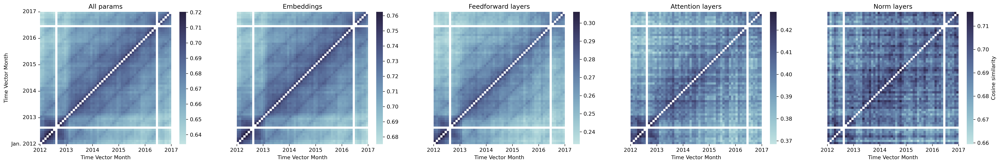

In [13]:
monthly_vec_cos_sims = np.load("./data/t5-small_monthly_param_time_vec_distances.npy", allow_pickle=True).item()

cmap = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
cmap.set_over('black')

fig, axs = plt.subplots(1, 5, figsize=(32, 4.5))
axs = axs.flatten()
for i, param in enumerate(monthly_vec_cos_sims.keys()):
    print(param)
    #fig, ax = plt.subplots(1, 2, figsize=(14, 5))
    #axs = axs.flatten()

    #fig.suptitle(str(param))

    wmt_monthly_vec_sims = monthly_vec_cos_sims[param]["wmt_lm_cos_dist"]
    np.fill_diagonal(wmt_monthly_vec_sims, np.nan)
    wmt_monthly_vec_sims[7, :] = np.nan
    wmt_monthly_vec_sims[:, 7] = np.nan
    wmt_monthly_vec_sims[53, :] = np.nan
    wmt_monthly_vec_sims[:, 53] = np.nan
    if i == 4:
        sns.heatmap(wmt_monthly_vec_sims, ax=axs[i], cmap=cmap, cbar_kws={'label': 'Cosine similarity'})
    else:
        sns.heatmap(wmt_monthly_vec_sims, ax=axs[i], cmap=cmap)
    #axs[0].invert_yaxis()
    #axs[0].set_title("WMT LM")

    #poli_aff_monthly_vec_sims = monthly_vec_cos_sims[param]["poli_aff_cos_dist"]
    #np.fill_diagonal(poli_aff_monthly_vec_sims, np.nan)
    #ax = sns.heatmap(poli_aff_monthly_vec_sims, ax=axs[1], cmap=cmap, cbar_kws={'label': 'Cosine similarity'})
    #axs[1].invert_yaxis()
    #axs[1].set_title("PoliAff")
    #plt.show()

    axs[i].invert_yaxis()
    ticks = list(range(0, 61, 12))
    tick_labels = list(range(2012, 2018))
    axs[i].set_xticks(ticks=ticks, labels=tick_labels, rotation='horizontal')
    tick_labels[0] = "Jan. 2012"
    if i == 0:
        axs[i].set_yticks(ticks=ticks, labels=tick_labels, rotation='horizontal')
        axs[i].set_ylabel("Time Vector Month")
    else:
        axs[i].set_yticks([])
    axs[i].set_xlabel("Time Vector Month")


axs[0].set_title("All params")
axs[1].set_title("Embeddings")
axs[2].set_title("Feedforward layers")
axs[3].set_title("Attention layers")
axs[4].set_title("Norm layers")
plt.show()



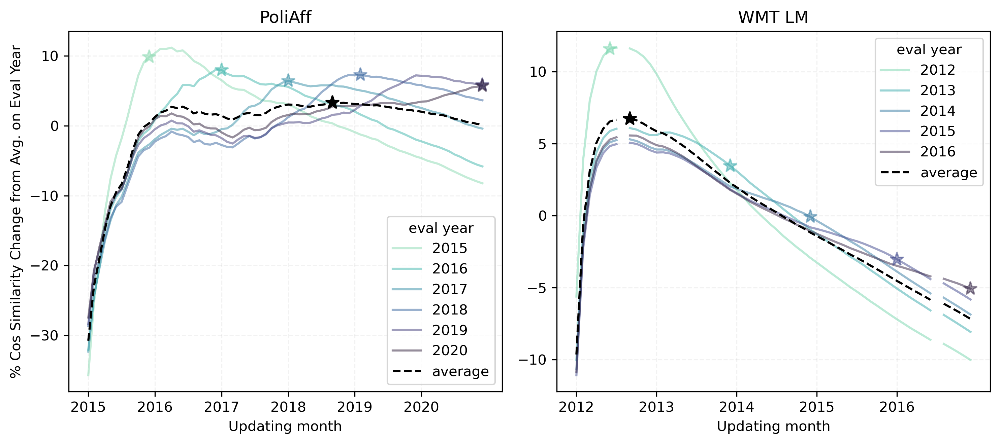

In [5]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4.5))
axs = axs.flatten()


linear_updating_ckpt_year_sims = np.load("./data/t5-small_linear_monthly_updating_ckpt_dists.npy", allow_pickle=True).item()
palette = sns.color_palette("mako_r", 5)
wmt_ckpt_year_sims = linear_updating_ckpt_year_sims["wmt_lm_cos_dist"]
for param in [None]: #wmt_ckpt_year_sims.keys():
    csim_avg = []
    eval_year_to_norm_csims = {}
    for eval_year, csims in wmt_ckpt_year_sims[param].items():
        csims = np.insert(csims, [7, 53], np.nan)
        mean_csims = np.nanmean(csims, axis=0)
        csims = 100 * (csims - mean_csims) / mean_csims # normalizing
        axs[1].plot(list(range(len(csims))), csims, alpha=0.5, label=eval_year, c=palette[eval_year - 2012])
        csim_avg.append(csims)
        eval_year_to_norm_csims[eval_year] = csims

    csim_avg = np.mean(csim_avg, axis=0)
    axs[1].plot(csim_avg, '--', label="average", c="black")
    axs[1].plot(np.nanargmax(csim_avg), np.nanmax(csim_avg),
                "*", c="black", ms=10)

    # Star relative max to mean
    for eval_year, csims in eval_year_to_norm_csims.items():
        max_rel_idx = np.nanargmax(csims - csim_avg)
        axs[1].plot(max_rel_idx, csims[max_rel_idx],
                "*", c=palette[eval_year - 2012], ms=10, alpha=0.5)

    axs[1].set_title("WMT LM")
    axs[1].legend(title="eval year")
    #plt.ylabel("Normalized cosine similarity")
    axs[1].set_xlabel("Updating month")
    axs[1].set_xticks(ticks=list(range(0, 60, 12)), labels=list(range(2012, 2017)))

palette = sns.color_palette("mako_r", 6)
wmt_ckpt_year_sims = linear_updating_ckpt_year_sims["poli_aff_cos_dist"]
for param in [None]: #wmt_ckpt_year_sims.keys():
    csim_avg = []
    eval_year_to_norm_csims = {}
    for eval_year, csims in wmt_ckpt_year_sims[param].items():
        mean_csims = np.nanmean(csims, axis=0)
        csims = 100 * (csims - mean_csims) / mean_csims # normalizing
        axs[0].plot(list(range(len(csims))), csims, alpha=0.5, label=eval_year, c=palette[eval_year - 2015])
        #axs[0].plot(np.nanargmax(csims), np.nanmax(csims),
        #        "*", c=palette[eval_year - 2015], alpha=0.5, ms=10)
        csim_avg.append(csims)
        eval_year_to_norm_csims[eval_year] = csims

    csim_avg = np.mean(csim_avg, axis=0)
    axs[0].plot(csim_avg, '--', label="average", c="black")
    axs[0].plot(np.nanargmax(csim_avg), np.nanmax(csim_avg),
                "*", c="black", ms=10)

    # Star relative max to mean
    for eval_year, csims in eval_year_to_norm_csims.items():
        max_rel_idx = np.nanargmax(csims - csim_avg)
        axs[0].plot(max_rel_idx, csims[max_rel_idx],
                "*", c=palette[eval_year - 2015], ms=10, alpha=0.5)

    axs[0].set_title("PoliAff")
    axs[0].legend(title="eval year")
    axs[0].set_ylabel("% Cos Similarity Change from Avg. on Eval Year")
    axs[0].set_xlabel("Updating month")
    axs[0].set_xticks(ticks=list(range(0, 72, 12)), labels=list(range(2015, 2021)))

axs[0].grid(True)
axs[1].grid(True)
plt.rc('grid', linestyle="--", color='gray', alpha=0.1)

fig.tight_layout()

dict_keys([None, 'embeddings', 'ff_layers', 'attn', 'norm'])
-0.6666761875672899 0.0
0.0000000000000000
[-6.797471336400627, -5.8427560319862275, -5.236991360913061, -4.8851155959887445, -5.189839594525527, -5.493470404034331, -5.22483720045189, nan, -5.285105009077749, -4.728411663125298, -5.0273614884128826, -5.3936600960305405, -5.058643305890842, -4.258295793669138, -4.145375190168234, -3.5881929907967622, -3.67556020256574, -4.03824887742794, -4.081133398576936, -3.7310285095518143, -3.6356817914460557, -3.629423094762141, -3.706084853131817, -4.495025975615608, -3.5323717044989396, -3.668535071679097, -5.196580301804279, -3.91214159287477, -3.789349042914871, -4.816947290475968, -4.6268928588002876, -4.780800354741667, -4.739042684058272, -4.302831574486033, -3.973731258247934, -4.286635877223155, -4.244569929299591, -3.8872815252162662, -3.716391265565183, -3.6488374711328526, -3.877333912177161, -3.8949315733322107, -3.844855121502331, -3.8314684294202985, -4.347819807045356, -

/var/folders/76/70fs0djn7lb2y98w5_hxbtx00000gn/T/ipykernel_5901/3214466013.py:22: RuntimeWarning: Mean of empty slice
  col_mean = np.nanmean(wmt_monthly_perplexity, axis=0)


Text(0, 0.5, 'Perplexity change from average on month (%)')

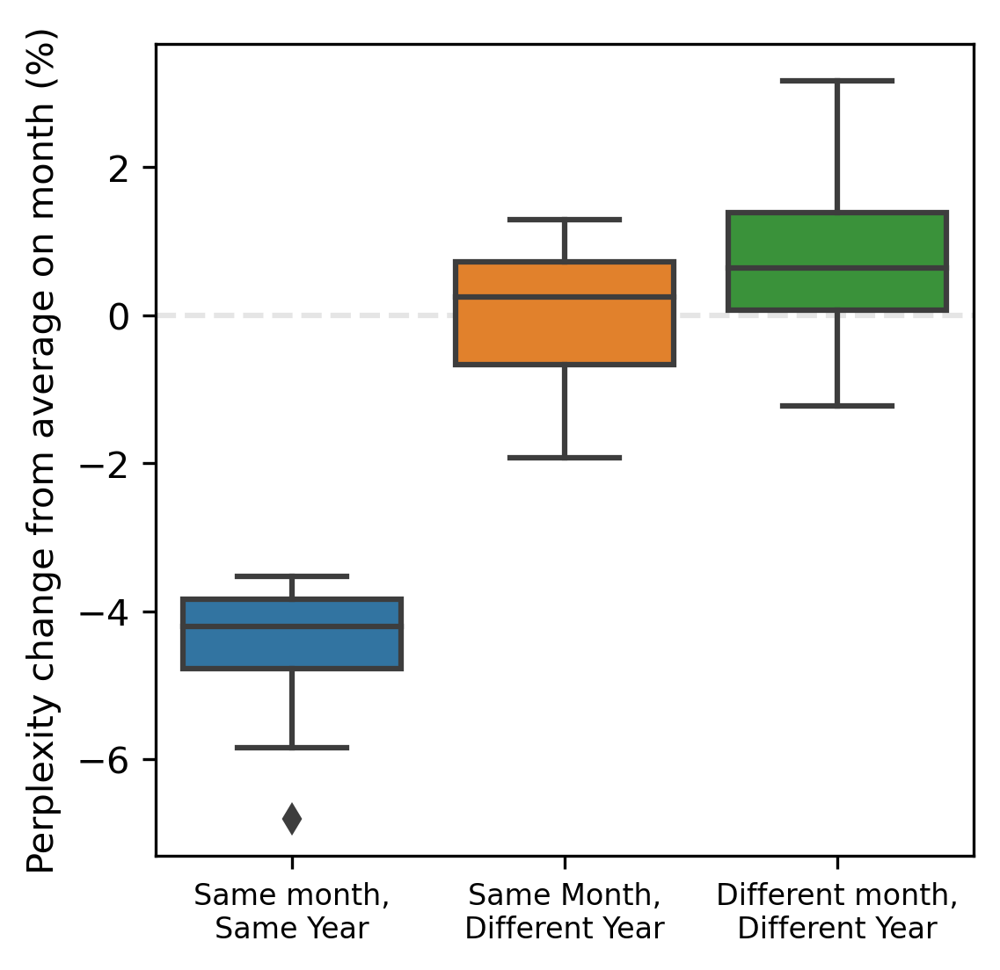

In [7]:
#fig, axs = plt.subplots(1, 2, figsize=(10, 5))
fig, axs = plt.subplots(1, 1, figsize=(4, 4))
#axs = axs.flatten()
axs = [axs]

wmt_monthly_eval_losses = pd.read_json("./data/t5-small_wmt_monthly_eval", lines=True)
wmt_monthly_vec_sims = np.load("./data/t5-small_monthly_param_time_vec_distances.npy", allow_pickle=True).item()
print(wmt_monthly_vec_sims.keys())
wmt_monthly_vec_sims = wmt_monthly_vec_sims[None]["wmt_lm_cos_dist"]

wmt_monthly_perplexity = np.empty((10 * 12, 10 * 12))
wmt_monthly_perplexity.fill(np.nan)


for i, row in wmt_monthly_eval_losses.iterrows():
    heatmap_col_idx = (int(row["eval_year"]) - 2012) * 12 + int(row["eval_month"])
    if not (row["train_year"] == "none" or row["train_month"] == "none"):
        heatmap_row_idx = (int(row["train_year"]) - 2012) * 12 + int(row["train_month"])
        wmt_monthly_perplexity[heatmap_row_idx][heatmap_col_idx] = row["eval_loss"]

wmt_monthly_perplexity = np.exp(wmt_monthly_perplexity[:60, :60])
col_mean = np.nanmean(wmt_monthly_perplexity, axis=0)
wmt_monthly_perplexity = 100 * (wmt_monthly_perplexity - col_mean) / col_mean

wmt_monthly_vec_sims[7, :] = np.nan
wmt_monthly_vec_sims[:, 7] = np.nan
wmt_monthly_vec_sims[53, :] = np.nan
wmt_monthly_vec_sims[:, 53] = np.nan

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(wmt_monthly_perplexity[~np.isnan(wmt_monthly_perplexity)].flatten(),
                                                                     wmt_monthly_vec_sims[~np.isnan(wmt_monthly_vec_sims)].flatten())

print(r_value, p_value)
print('{0:.16f}'.format(p_value))


diagonal_perplexities = []
same_month_perplexities = []
diff_month_perplexities = []
same_month_cos_sims = []
diff_month_cos_sims = []

for m1 in range(len(wmt_monthly_perplexity)):
    for m2 in range(len(wmt_monthly_perplexity)):
        # If same month in a different year
        if m1 == m2:
            diagonal_perplexities.append(wmt_monthly_perplexity[m1][m2])
        elif m1 % 12 == m2:
            same_month_perplexities.append(wmt_monthly_perplexity[m1][m2])
            same_month_cos_sims.append(wmt_monthly_vec_sims[m1][m2])
        elif m2 < m1 - 12 or m2 > m1 + 12:
            diff_month_perplexities.append(wmt_monthly_perplexity[m1][m2])
            diff_month_cos_sims.append(wmt_monthly_vec_sims[m1][m2])

print(diagonal_perplexities)
diagonal_perplexities = np.array(diagonal_perplexities)
same_month_perplexities = np.array(same_month_perplexities)
diff_month_perplexities = np.array(diff_month_perplexities)
same_month_cos_sims = np.array(same_month_cos_sims)
diff_month_cos_sims = np.array(diff_month_cos_sims)
diagonal_perplexities = diagonal_perplexities[~np.isnan(diagonal_perplexities)]
same_month_perplexities = same_month_perplexities[~np.isnan(same_month_perplexities)]
diff_month_perplexities = diff_month_perplexities[~np.isnan(diff_month_perplexities)]
same_month_cos_sims = same_month_cos_sims[~np.isnan(same_month_cos_sims)]
diff_month_cos_sims = diff_month_cos_sims[~np.isnan(diff_month_cos_sims)]

axs[0].axhline(y=0, color='black', linestyle='--', zorder=0, alpha=0.1)

#axs[0].spines[["top", 'right']].set_visible(False)
sns.boxplot(ax=axs[0], data=[diagonal_perplexities, same_month_perplexities, diff_month_perplexities])
#sns.violinplot(ax=axs[1], data=[same_month_cos_sims, diff_month_cos_sims], inner='quartile')
#plt.subplots_adjust(wspace=0, hspace=0)

print(np.mean(diagonal_perplexities), np.mean(same_month_perplexities), np.mean(diff_month_perplexities))

axs[0].set_xticks(ticks=[0, 1, 2], labels=["Same month,\nSame Year", "Same Month,\nDifferent Year", "Different month,\nDifferent Year"], fontsize=8)
axs[0].set_ylabel("Perplexity change from average on month (%)")
#axs[1].set_xticks(ticks=[0, 1], labels=["Same month,\nDifferent Year", "Different Month,\nDifferent Year"])
#axs[1].set_ylabel("Cosine similarity")
